# Project 2 Computer Vision CS-GY 6643
Team Members:
- Diego Rosenebrg (dr3432)
- Thiago Viegas (tjv235)


In [ ]:
# Libraries
import os
import numpy as np
import pandas as pd
import cv2

import matplotlib.pyplot as plt
from pathlib import Path
from scipy import ndimage
from tqdm import tqdm
import zipfile

In [ ]:
# Load Drive
from google.colab import drive
drive.mount('/content/drive')

root_folder = "/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 2" # @param {type: "string"}

root_path = Path(root_folder)
print(root_path)

Mounted at /content/drive
/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 2


## Question 1


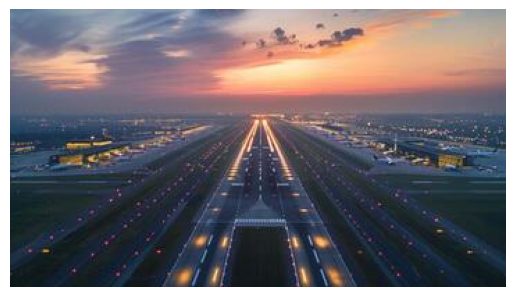

In [ ]:
q1_folder = "q1_resources"
q1_path = root_path / q1_folder

# Load images
image = cv2.imread(str(q1_path / "runaway.jpeg"))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)
plt.axis('off')
plt.show()

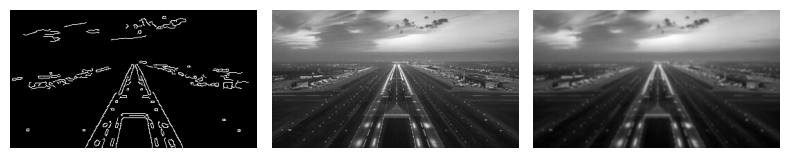

In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

kernel_size = (5,5)

sigmaX_low = 2
sigmaX_high = 5

sigmaY_low = 2
sigmaY_high = 5

#Apply Gaussian blur
image_blur = cv2.GaussianBlur(image_gray, kernel_size, 0)

#Perform Canny edge detection
edges = cv2.Canny(image_blur, 75, 150)

fig, axes = plt.subplots(1, 3, figsize=(8, 8))
axes[0].imshow(edges, cmap='gray')
axes[0].axis('off')

axes[1].imshow(image_gray, cmap='gray')
axes[1].axis('off')

axes[2].imshow(image_blur, cmap='gray')
axes[2].axis('off')

plt.tight_layout()
plt.show()

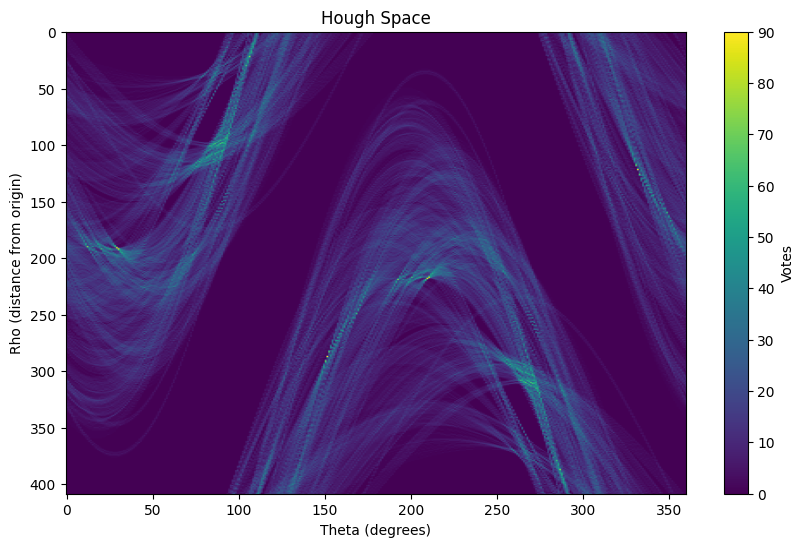

In [ ]:
#will do Hough Transform to detect lines in the image
hough_space = np.zeros((int(np.sqrt(edges.shape[0]**2 + edges.shape[1]**2)), 360), dtype=np.uint64)

#create theta values
thetas = np.deg2rad(np.arange(0, 360))

#Get coordinates of edge points
edge_points = np.argwhere(edges)

#Vote in Hough space
for y, x in edge_points:
    for theta_idx in range(len(thetas)):
        theta = thetas[theta_idx]
        rho = int(x * np.cos(theta) + y * np.sin(theta))
        hough_space[rho, theta_idx] += 1


plt.figure(figsize=(10, 6))
plt.imshow(hough_space, cmap='viridis', aspect='auto')
plt.title('Hough Space')
plt.xlabel('Theta (degrees)')
plt.ylabel('Rho (distance from origin)')
plt.colorbar(label='Votes')
plt.show()

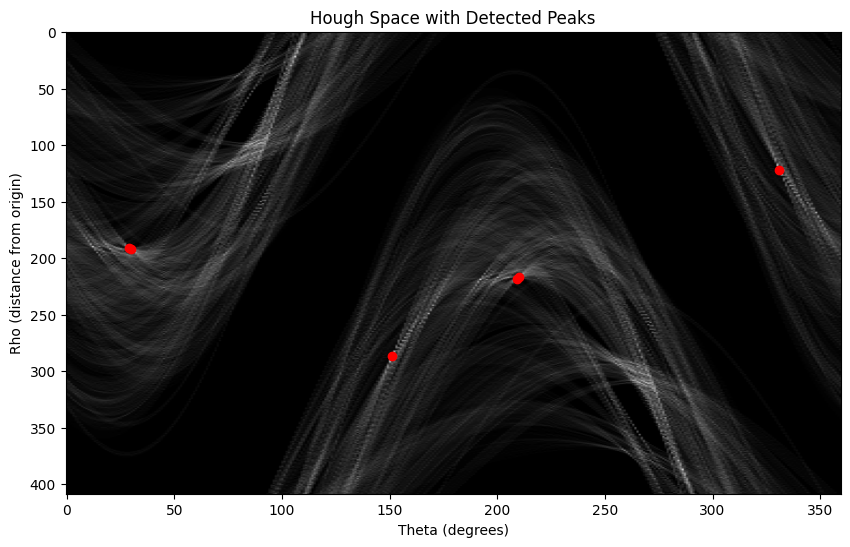

In [ ]:
threshold = 75
peaks = np.argwhere(hough_space > threshold)


plt.figure(figsize=(10, 6))
plt.imshow(hough_space, cmap='gray', aspect='auto')
plt.scatter(peaks[:, 1], peaks[:, 0], color='red')
plt.title('Hough Space with Detected Peaks')
plt.xlabel('Theta (degrees)')
plt.ylabel('Rho (distance from origin)')
plt.show()

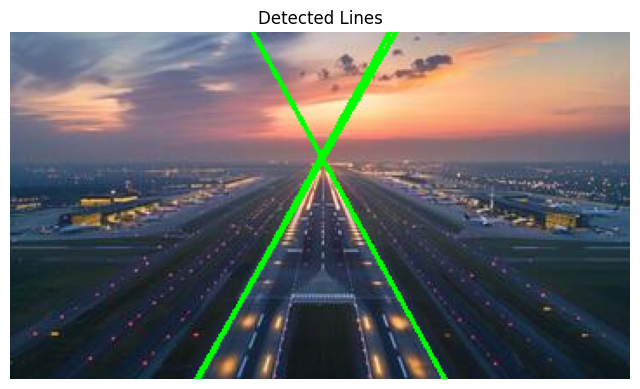

In [ ]:
output_image = image.copy()

for rho, theta_idx in peaks:
    theta = thetas[theta_idx]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(output_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(8, 8))
plt.imshow(output_image)
plt.title('Detected Lines')
plt.axis('off')
plt.title('Detected Lines')
plt.show()

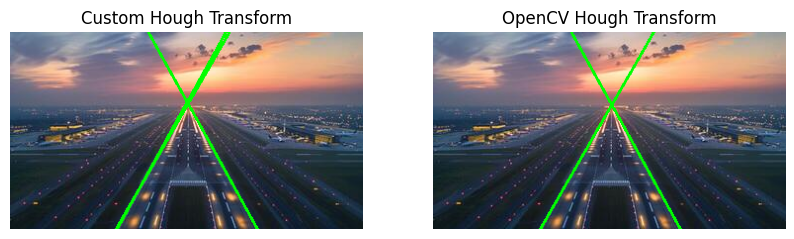

In [ ]:
lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold)
output_image_builtin = image.copy()

for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(output_image_builtin, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(output_image)
plt.axis('off')
plt.title('Custom Hough Transform')
plt.subplot(1, 2, 2)
plt.imshow(output_image_builtin)
plt.axis('off')
plt.title('OpenCV Hough Transform')
plt.show()


### Part B

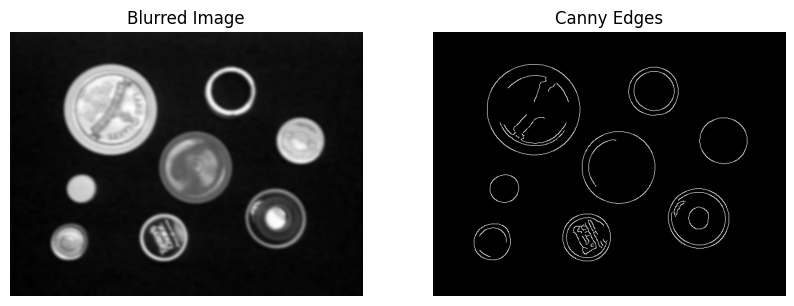

In [ ]:
coins1 = cv2.imread(str(q1_path / "circles1.gif"), cv2.IMREAD_GRAYSCALE)

#images are already gray scaled so no need to convert
blurred_coins1 = cv2.GaussianBlur(coins1, (13,13), 0)

edges = cv2.Canny(blurred_coins1, 100, 150)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(blurred_coins1, cmap='gray')
plt.axis('off')
plt.title('Blurred Image')

plt.subplot(1, 2, 2)
plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.title('Canny Edges')
plt.show()


Alhtough Canny edges paint a good picture to start off some double circles add to the noise in the image and, if the hough circles are applied to the canny edges image, there are some impacts to performance. therefore we will pass the blurred image directly instead of the canny edge image in order to improve performance.

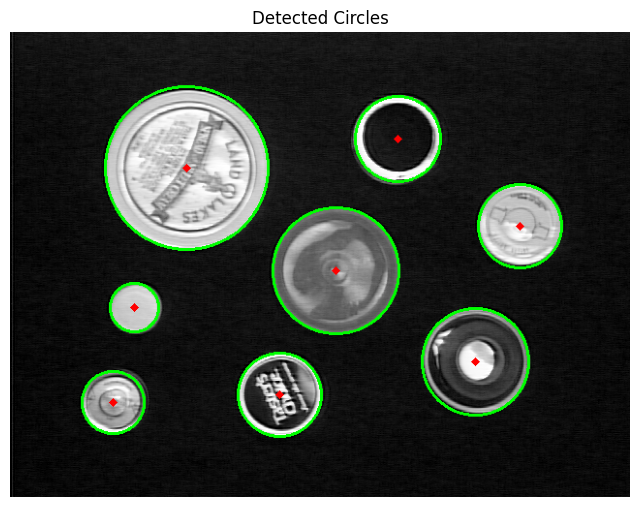

In [ ]:
circles = cv2.HoughCircles(blurred_coins1, cv2.HOUGH_GRADIENT, dp=1, minDist=25, param1=100, param2=50, minRadius=15, maxRadius=100)

if circles is not None:
    circles = np.uint16(np.around(circles))
    output_image_circles = cv2.cvtColor(coins1, cv2.COLOR_GRAY2BGR)

    for i in circles[0, :]:
        cv2.circle(output_image_circles, (i[0], i[1]), i[2], (0, 255, 0), 2)
        cv2.circle(output_image_circles, (i[0], i[1]), 2, (0, 0, 255), 3)

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(output_image_circles, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Detected Circles')
    plt.show()
else:
    print("No circles were detected.")

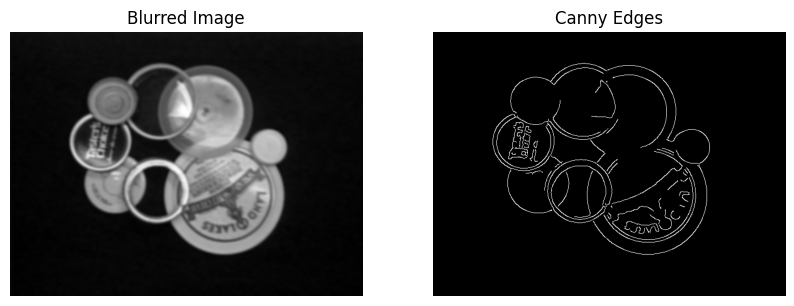

In [ ]:
coins2 = cv2.imread(str(q1_path / "circles2.gif"), cv2.IMREAD_GRAYSCALE)

blurred_coins2 = cv2.GaussianBlur(coins2, (11,11), 0)
edges2 = cv2.Canny(blurred_coins2, 100, 150)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(blurred_coins2, cmap='gray')
plt.axis('off')
plt.title('Blurred Image')
plt.subplot(1, 2, 2)
plt.imshow(edges2, cmap='gray')
plt.axis('off')
plt.title('Canny Edges')
plt.show()

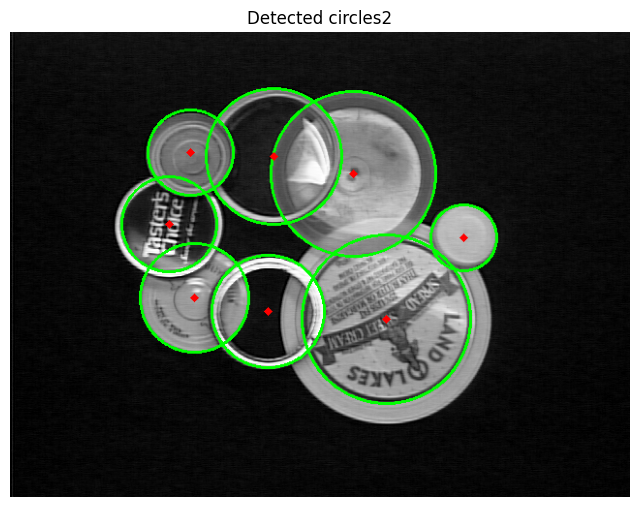

In [ ]:
circles2 = cv2.HoughCircles(blurred_coins2, cv2.HOUGH_GRADIENT, dp=1, minDist=75, param1=80, param2=40, minRadius=25, maxRadius=140)

if circles2 is not None:
    circles2 = np.uint16(np.around(circles2))
    output_image_circles2 = cv2.cvtColor(coins2, cv2.COLOR_GRAY2BGR)

    for i in circles2[0, :]:
        cv2.circle(output_image_circles2, (i[0], i[1]), i[2], (0, 255, 0), 2)
        cv2.circle(output_image_circles2, (i[0], i[1]), 2, (0, 0, 255), 3)

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(output_image_circles2, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Detected circles2')
    plt.show()
else:
    print("No circles2 were detected.")

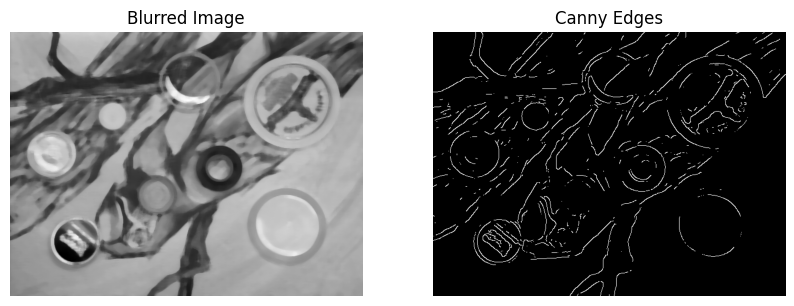

In [ ]:
coins3 = cv2.imread(str(q1_path / "circles3.gif"), cv2.IMREAD_GRAYSCALE)
median_coins = cv2.medianBlur(coins3, 9)
#blurred_coins3 = cv2.GaussianBlur(median_coins, (9,9), 0)

edges3 = cv2.Canny(median_coins, 150, 150)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(median_coins, cmap='gray')
plt.axis('off')
plt.title('Blurred Image')
plt.subplot(1, 2, 2)
plt.imshow(edges3, cmap='gray')
plt.axis('off')
plt.title('Canny Edges')
plt.show()

Alhtough Canny edges paint a good picture to start off the background noise is hard to remove. Using the Hough Circles directly (without passing the canny edges image) we can more easily extract the circles from the image.

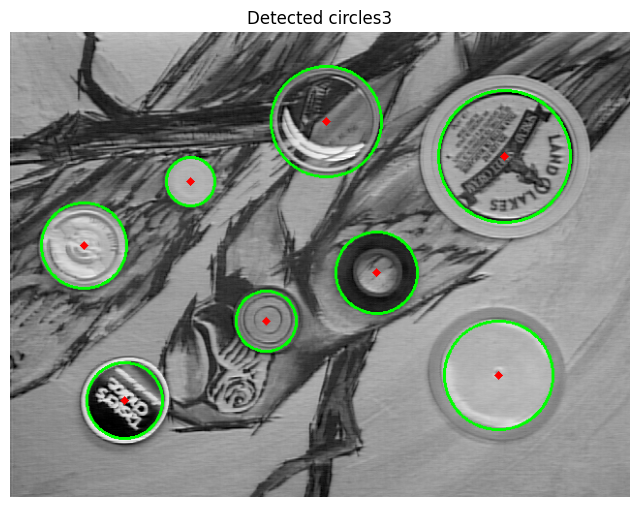

In [ ]:
circles3 = cv2.HoughCircles(median_coins, cv2.HOUGH_GRADIENT, dp=1, minDist=50, param1=100, param2=60, minRadius=10, maxRadius=110)


if circles3 is not None:
    circles3 = np.uint16(np.around(circles3))
    output_image_circles3 = cv2.cvtColor(coins3, cv2.COLOR_GRAY2BGR)

    for i in circles3[0, :]:
        cv2.circle(output_image_circles3, (i[0], i[1]), i[2], (0, 255, 0), 2)
        cv2.circle(output_image_circles3, (i[0], i[1]), 2, (0, 0, 255), 3)

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(output_image_circles3, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Detected circles3')
    plt.show()

Overall, applying the Hough transform directly to the images was more performant than applying the Canny edge filter and passing a "denoised version" of the image through the Hough transform. Applying the Canny edges proved to increment the local noise that the coins provided since the smaller structures within the coins were one of the few features remaning to the image, and thus compilcated the process for the Hough transform.

## Question 2

/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 2/q2_resources/cv_desk.png


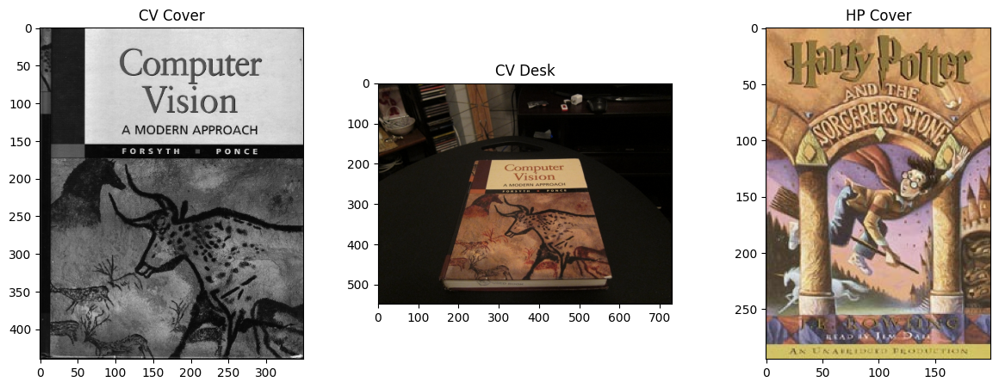

In [ ]:
q2_folder = "q2_resources"
q2_path = root_path / q2_folder

cv_cover = "cv_cover.jpg"
cv_cover_path = q2_path / cv_cover

cv_desk = "cv_desk.png"
cv_desk_path = q2_path / cv_desk
print(cv_desk_path)

hp_cover = "hp_cover.jpg"
hp_cover_path = q2_path / hp_cover

# Load images with cv2
cv_cover = cv2.imread(str(cv_cover_path), cv2.IMREAD_GRAYSCALE)
cv_desk = cv2.imread(str(cv_desk_path), cv2.IMREAD_COLOR_BGR)
hp_cover = cv2.imread(str(hp_cover_path), cv2.IMREAD_COLOR_BGR)

# Convert color images to RGB
cv_desk_rgb = cv2.cvtColor(cv_desk, cv2.COLOR_BGR2RGB)
hp_cover_rgb = cv2.cvtColor(hp_cover, cv2.COLOR_BGR2RGB)


# Display all 3 images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(cv_cover, cmap='gray')
axs[0].set_title("CV Cover")
axs[1].imshow(cv_desk_rgb)
axs[1].set_title("CV Desk")
axs[2].imshow(hp_cover_rgb)
axs[2].set_title("HP Cover")
plt.show()

CV Cover Ratio: 1.2571428571428571
HP Cover Ratio: 1.475


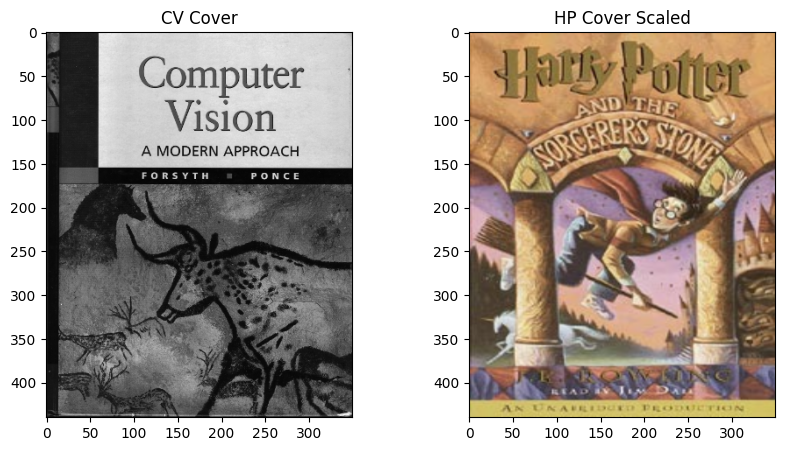

In [ ]:
# Calculate ratio between the length and height of cv cover and hp cover
cv_cover_ratio = cv_cover.shape[0] / cv_cover.shape[1]
hp_cover_ratio = hp_cover.shape[0] / hp_cover.shape[1]

print(f"CV Cover Ratio: {cv_cover_ratio}")
print(f"HP Cover Ratio: {hp_cover_ratio}")

# Scaling transformation to make hp_cover the same size of cv_cover (without shearing)
hp_cover_rgb_scaled = cv2.resize(hp_cover_rgb, (cv_cover.shape[1], cv_cover.shape[0]))

# Display both
fig, axs = plt.subplots(1,2, figsize=(10,5))
axs[0].imshow(cv_cover, cmap='gray')
axs[0].set_title("CV Cover")
axs[1].imshow(hp_cover_rgb_scaled)
axs[1].set_title("HP Cover Scaled")
plt.show()

The above is required so that we can later use the transformation obtained for the CV cover for the HP book. If not it would not be in the same scale and there would be leftover edges from the other book.

This would be equivalent to calculating a
$$\begin{bmatrix}
a & 0 \\
0 & b
\end{bmatrix}$$
Matrix transformation that we would layer on to (multiply) the warping found between the CV cover and the desk image. The scaling done by the cv2.resize is equivalent since it only stretched the cover on the x and y axis without any shearing.

Detected 1415 keypoints in original image
Detected 1205 keypoints in transformed image


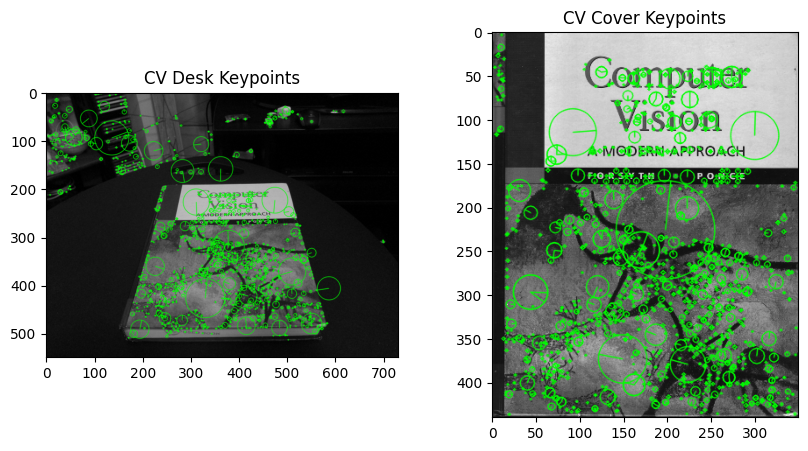

In [ ]:
# Transform cv_desk image to grayscale to perform SIFT
cv_desk_gray = cv2.cvtColor(cv_desk, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
cv_desk_keypoints, cv_desk_descriptors = sift.detectAndCompute(cv_desk_gray, None)
cv_cover_keypoints, cv_cover_descriptors = sift.detectAndCompute(cv_cover, None)

print(f"Detected {len(cv_desk_keypoints)} keypoints in original image")
print(f"Detected {len(cv_cover_keypoints)} keypoints in transformed image")

# Show found keypoints
img_desk_keypoints = cv2.drawKeypoints(cv_desk_gray, cv_desk_keypoints, None,
                                        color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_cover_keypoints = cv2.drawKeypoints(cv_cover, cv_cover_keypoints, None,
                                        color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axs = plt.subplots(1,2, figsize=(10,5))
axs[0].imshow(img_desk_keypoints)
axs[0].set_title("CV Desk Keypoints")
axs[1].imshow(img_cover_keypoints)
axs[1].set_title("CV Cover Keypoints")
plt.show()

[[ 7.33127473e-01 -3.39489927e-01  2.38006725e+02]
 [-1.94905127e-02  2.29685901e-01  1.92969527e+02]
 [-3.45173717e-05 -9.03318888e-04  1.00000000e+00]]


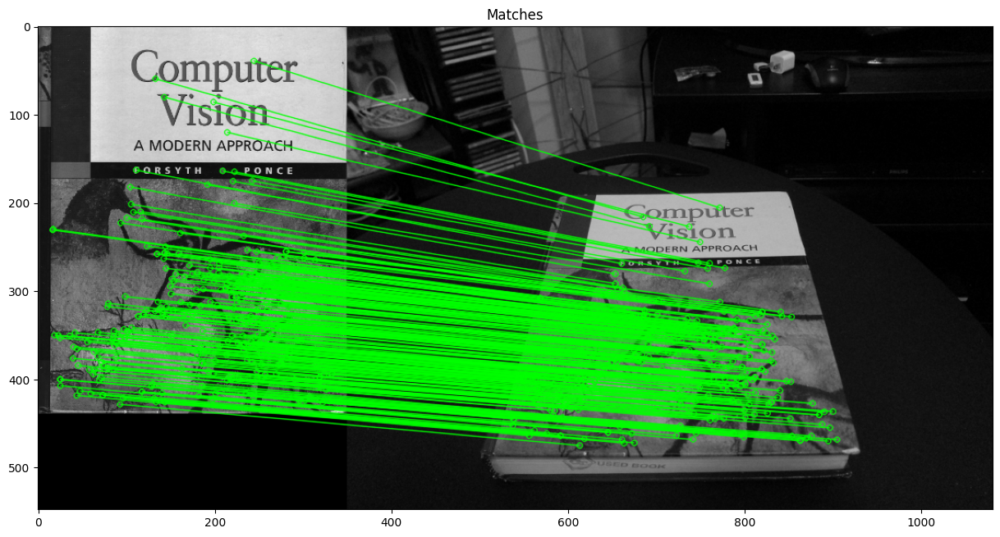

In [ ]:
# Feature Match with Flann
FLANN_INDEX_KDTREE = 1
indexParams = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
searchParams = dict(checks=50)
flann = cv2.FlannBasedMatcher(indexParams, searchParams)

nNeighors = 2
matches = flann.knnMatch(cv_cover_descriptors, cv_desk_descriptors, k=nNeighors)

# Keep best matches
good_matches = [m for m, n in matches if m.distance < 0.7 * n.distance]
# Sort
good_matches = sorted(good_matches, key=lambda x: x.distance)


minGoodMatches = 20

if len(good_matches) > minGoodMatches:
    src_pts = np.float32([cv_cover_keypoints[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([cv_desk_keypoints[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    error_threshold = 3.0
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, error_threshold)
    print(M)

    matchesMask = mask.ravel().tolist()

    h,w = cv_cover.shape
    img_border = np.float32([[0,0],[0, h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
    warped_image_border = cv2.perspectiveTransform(img_border, M)
    desk_img_drawn_border = cv2.polylines(cv_desk, [np.int32(warped_image_border)], True, (0,255,0), 3, cv2.LINE_AA)

    green = (0,255,0)
    drawParams = dict(matchColor=green, singlePointColor=None, matchesMask=matchesMask, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
    img_matches = cv2.drawMatches(cv_cover, cv_cover_keypoints, cv_desk_gray, cv_desk_keypoints, good_matches, None, **drawParams)

    plt.figure(figsize=(15,10))
    plt.imshow(img_matches)
    plt.title("Matches")
    plt.show()


else:
    raise Exception("Not enough matches found.")


Now we can map the found homography to the HP book.

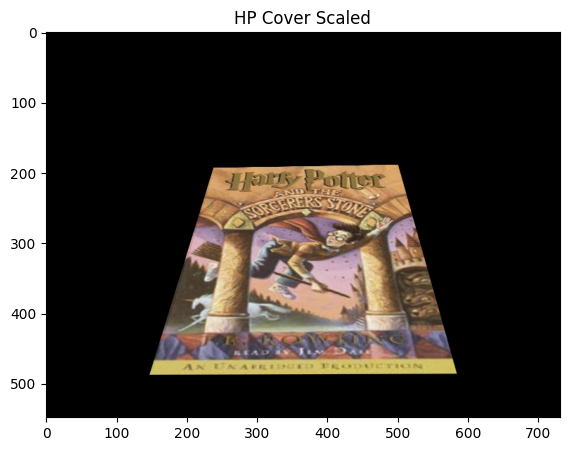

In [ ]:
# Apply M to scaled hp cover
hp_cover_scaled = cv2.warpPerspective(hp_cover_rgb_scaled, M, (cv_desk.shape[1], cv_desk.shape[0]))

# Show hp_cover_scaled image after warp
plt.figure(figsize=(10,5))
plt.imshow(hp_cover_scaled)
plt.title("HP Cover Scaled")
plt.show()

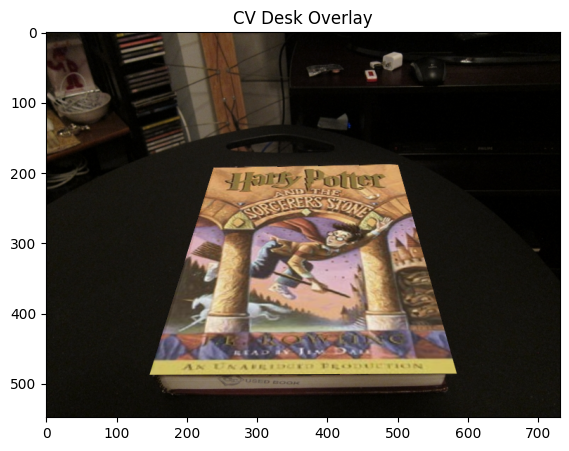

In [ ]:
# Create copy of image
cv_desk_rgb_overlay = cv_desk_rgb.copy()

# Where hp_cover_scaled is not zero overlay image
cv_desk_rgb_overlay[hp_cover_scaled[:, :, 0] != 0] = hp_cover_scaled[hp_cover_scaled[:, :, 0] != 0]

# Blend image to add realism
# blended_image = cv2.addWeighted(cv_desk_rgb_overlay, 0.9, cv_desk_rgb, 0.1, 0)
# plt.imshow(blended_image)
# plt.title("HP Cover with CV Desk Texture")
# plt.show()

# Display
plt.figure(figsize=(10,5))
plt.imshow(cv_desk_rgb_overlay)
plt.title("CV Desk Overlay")
plt.show()

## Question 3

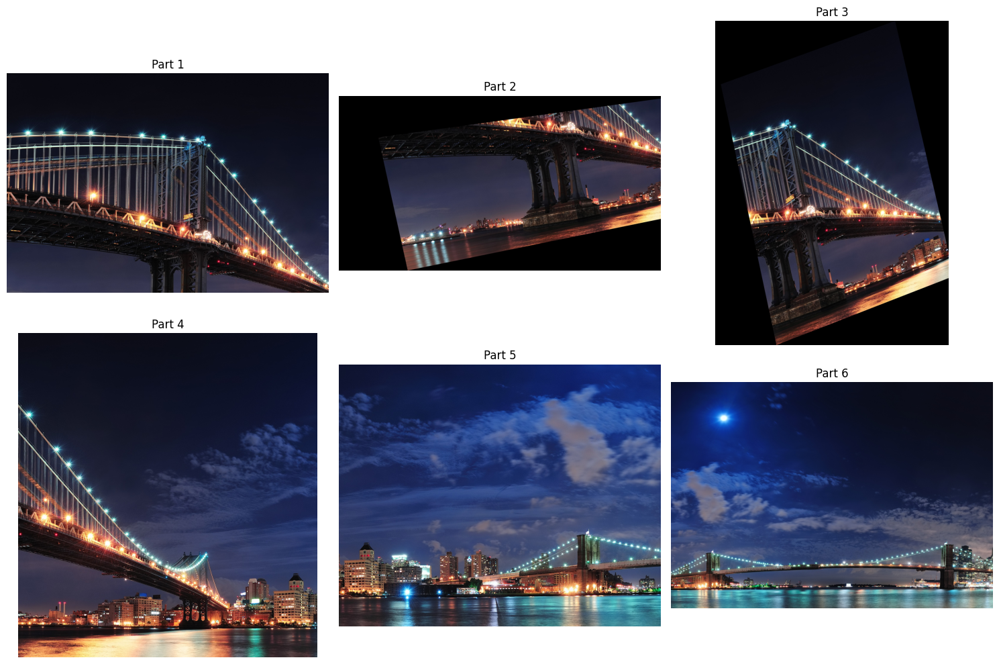

In [ ]:
q3_folder = "q3_resources"

q3_path = root_path / q3_folder

# Load images
# Open all six images
nyc_part_one_rgb = cv2.cvtColor(cv2.imread(str(q3_path /'new-york-city_part1.jpg')),  cv2.COLOR_BGR2RGB)
nyc_part_two_distorted_rgb = cv2.cvtColor(cv2.imread(str(q3_path /'new-york-city_part2_DISTORTED.jpg')),  cv2.COLOR_BGR2RGB)
nyc_part_three_distorted_rgb = cv2.cvtColor(cv2.imread(str(q3_path /'new-york-city_part3_DISTORTED.jpg')),  cv2.COLOR_BGR2RGB)
nyc_part_four_rgb = cv2.cvtColor(cv2.imread(str(q3_path /'new-york-city_part4.jpg')),  cv2.COLOR_BGR2RGB)
nyc_part_five_rgb = cv2.cvtColor(cv2.imread(str(q3_path /'new-york-city_part5.jpg')),  cv2.COLOR_BGR2RGB)
nyc_part_six_rgb = cv2.cvtColor(cv2.imread(str(q3_path /'new-york-city_part6.jpg')),  cv2.COLOR_BGR2RGB)

# Plot all 6 images in grid
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Top row
axs[0, 0].imshow(nyc_part_one_rgb)
axs[0, 0].set_title("Part 1")
axs[0, 0].axis('off')

axs[0, 1].imshow(nyc_part_two_distorted_rgb)
axs[0, 1].set_title("Part 2")
axs[0, 1].axis('off')

axs[0, 2].imshow(nyc_part_three_distorted_rgb)
axs[0, 2].set_title("Part 3")
axs[0, 2].axis('off')

# Second row
axs[1, 0].imshow(nyc_part_four_rgb)
axs[1, 0].set_title("Part 4")
axs[1, 0].axis('off')

axs[1, 1].imshow(nyc_part_five_rgb)
axs[1, 1].set_title("Part 5")
axs[1, 1].axis('off')

axs[1, 2].imshow(nyc_part_six_rgb)
axs[1, 2].set_title("Part 6")
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()

Images 2 and 3 have some transformations so it would be best to apply a transformation to make them similar to part 1 and then attempt a stitching of all images. We want to treat part 1 as our "middle" as and map homographies to it, as part 2 and 3 are rotated and will therefore create other final rotations instead of "straight up" is we map homographies to it.

In [ ]:
# Convert all first three images to grayscale for feature detection and transformations
nyc_part_one_gray = cv2.cvtColor(nyc_part_one_rgb, cv2.COLOR_RGB2GRAY)
nyc_part_two_distorted_gray = cv2.cvtColor(nyc_part_two_distorted_rgb, cv2.COLOR_RGB2GRAY)
nyc_part_three_distorted_gray = cv2.cvtColor(nyc_part_three_distorted_rgb, cv2.COLOR_RGB2GRAY)

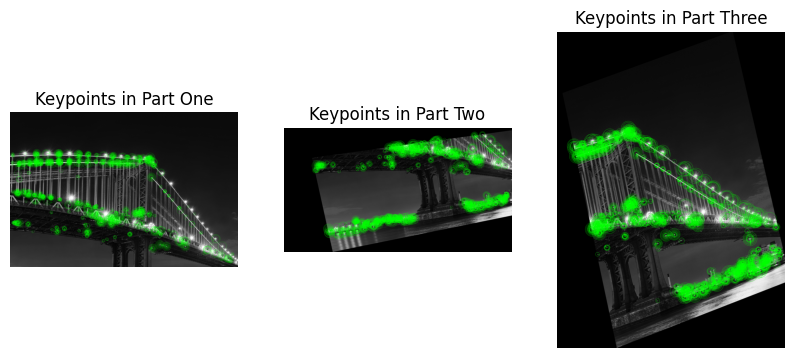

In [ ]:
# Initialize ORB detector
orb = cv2.ORB_create(nfeatures=2000)

# Find keypoints and descriptors
keypoints1, descriptors1 = orb.detectAndCompute(nyc_part_one_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(nyc_part_two_distorted_gray, None)
keypoints3, descriptors3 = orb.detectAndCompute(nyc_part_three_distorted_gray, None)

# Visualize keypoints
image_keypoints1 = cv2.drawKeypoints(nyc_part_one_gray, keypoints1, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image_keypoints2 = cv2.drawKeypoints(nyc_part_two_distorted_gray, keypoints2, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image_keypoints3 = cv2.drawKeypoints(nyc_part_three_distorted_gray, keypoints3, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.imshow(image_keypoints1)
plt.axis('off')
plt.title('Keypoints in Part One')
plt.subplot(1, 3, 2)
plt.imshow(image_keypoints2)
plt.axis('off')
plt.title('Keypoints in Part Two')
plt.subplot(1, 3, 3)
plt.imshow(image_keypoints3)
plt.axis('off')
plt.title('Keypoints in Part Three')
plt.show()

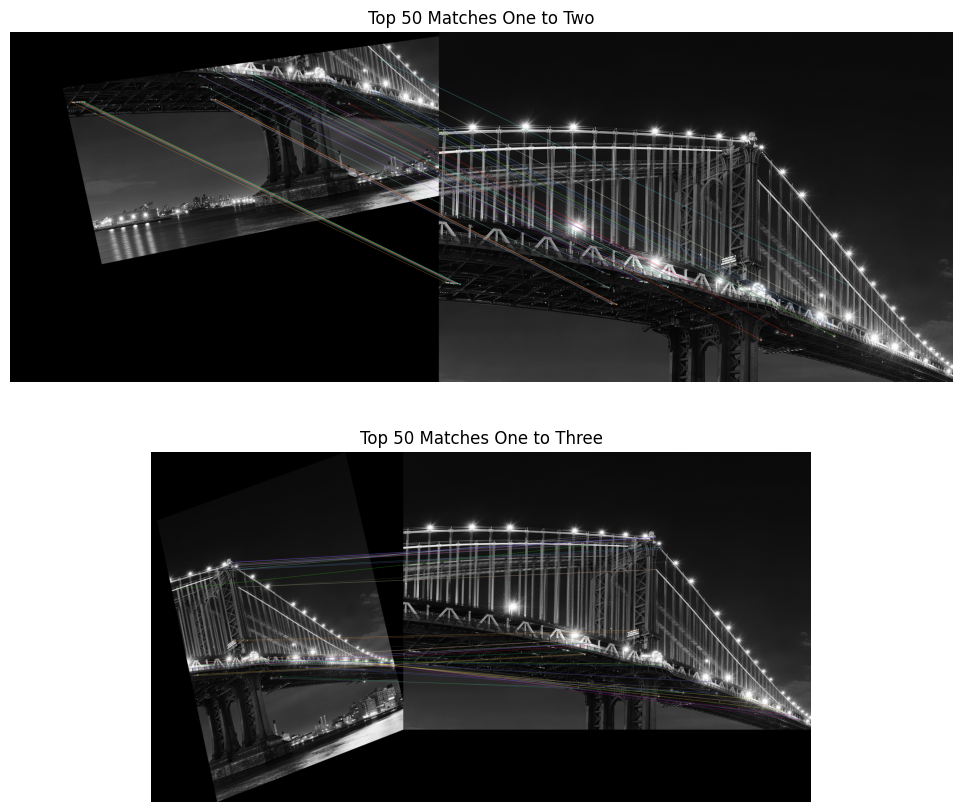

In [ ]:
#Create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

#Match descriptors Two->One and Three->One
matches_two_one = bf.match(descriptors2, descriptors1)
matches_three_one = bf.match(descriptors3, descriptors1)

# Sort matches in both to identify best matches.
matches_two_one = sorted(matches_two_one, key=lambda x: x.distance)
matches_three_one = sorted(matches_three_one, key=lambda x: x.distance)

# Visualize top 50 matches for both one to two and one to three
matched_image_one_two = cv2.drawMatches(nyc_part_two_distorted_gray, keypoints2,
                                        nyc_part_one_gray,
                                        keypoints1, matches_two_one[:50], None,
                                        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

matched_image_one_three = cv2.drawMatches(nyc_part_three_distorted_gray, keypoints3,
                                          nyc_part_one_gray,
                                          keypoints1, matches_three_one[:50], None,
                                          flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

#Draw top matches
plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)
plt.imshow(matched_image_one_two)
plt.axis('off')
plt.title('Top 50 Matches One to Two')
plt.subplot(2, 1, 2)
plt.imshow(matched_image_one_three)
plt.axis('off')
plt.title('Top 50 Matches One to Three')
plt.show()

In [ ]:
# Extract matched points to find Homography for both one->two and one->three
src_pts_two_one = np.float32([keypoints2[m.queryIdx].pt for m in matches_two_one]).reshape(-1, 1, 2)
dst_pts_two_one = np.float32([keypoints1[m.trainIdx].pt for m in matches_two_one]).reshape(-1, 1, 2)

src_pts_three_one = np.float32([keypoints3[m.queryIdx].pt for m in matches_three_one]).reshape(-1, 1, 2)
dst_pts_three_one = np.float32([keypoints1[m.trainIdx].pt for m in matches_three_one]).reshape(-1, 1, 2)

# Find two->one homography
H_two_one, mask_two_one = cv2.findHomography(src_pts_two_one, dst_pts_two_one, cv2.RANSAC, 5.0)

# Find three->one homography
H_three_one, mask_three_one = cv2.findHomography(src_pts_three_one, dst_pts_three_one, cv2.RANSAC, 5.0)

# Sanity Check for non-empty homography
if H_two_one is not None:
    inliers_two_one = np.sum(mask_two_one)
    print(f"Found {inliers_two_one} inliers for two->one homography.")
    print(f"Two->one homography matrix:\n{H_two_one}")
else:
    print("No inliers found for two->one homography.")

if H_three_one is not None:
    inliers_three_one = np.sum(mask_three_one)
    print(f"\nFound {inliers_three_one} inliers for three->one homography.")
    print(f"Three->one homography matrix:\n{H_three_one}")
else:
    print("No inliers found for three->one homography.")

Found 262 inliers for two->one homography.
Two->one homography matrix:
[[ 1.08610011e+00 -2.39774755e-01 -2.49632371e+02]
 [ 7.07098320e-02  1.10112244e+00  9.19326107e+02]
 [-6.32788782e-05 -1.80487824e-05  1.00000000e+00]]

Found 422 inliers for three->one homography.
Three->one homography matrix:
[[ 1.19683763e+00 -2.42252559e-01  1.31491776e+03]
 [ 4.36824649e-01  1.19964756e+00 -5.89663990e+02]
 [-6.13964034e-06  1.26813132e-05  1.00000000e+00]]


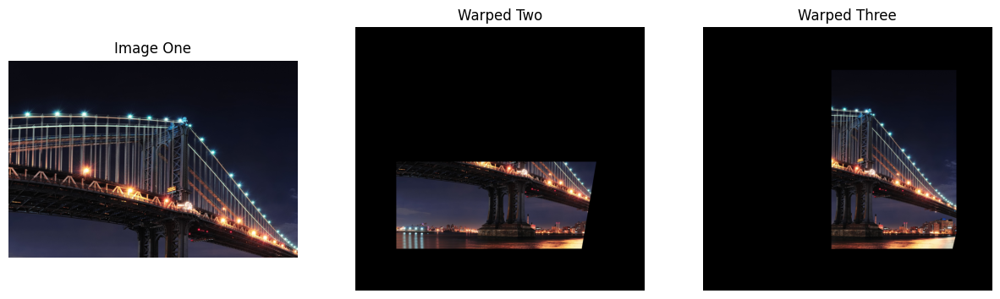

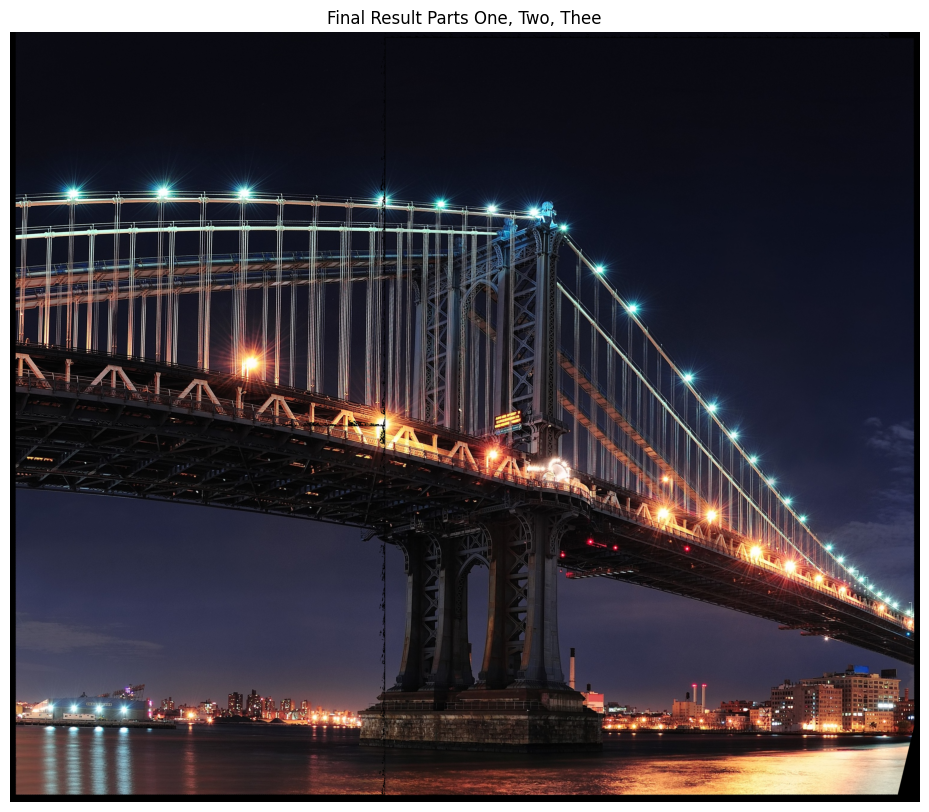

In [ ]:
# Stitch all images together
if H_two_one is not None and H_three_one is not None:
    h_two, w_two = nyc_part_two_distorted_rgb.shape[:2]
    h_three, w_three = nyc_part_three_distorted_rgb.shape[:2]
    h_one, w_one = nyc_part_one_rgb.shape[:2]

    # Get corners of all images after transformation
    corners_two = np.float32([[0, 0], [0, h_two], [w_two, h_two], [w_two, 0]]).reshape(-1, 1, 2)
    corners_two_transformed = cv2.perspectiveTransform(corners_two, H_two_one)

    corners_three = np.float32([[0, 0], [0, h_three], [w_three, h_three], [w_three, 0]]).reshape(-1, 1, 2)
    corners_three_transformed = cv2.perspectiveTransform(corners_three, H_three_one)

    corners_one = np.float32([[0, 0], [0, h_one], [w_one, h_one], [w_one, 0]]).reshape(-1, 1, 2)

    # Find bounding box
    all_corners = np.concatenate((corners_one, corners_two_transformed, corners_three_transformed), axis=0)
    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    # Translation to shift into view
    translation = np.array([
        [1, 0, -x_min],
        [0, 1, -y_min],
        [0, 0, 1]
    ])

    canvas_width = x_max - x_min
    canvas_height = y_max - y_min

    # Create canvas
    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)

    # Warp image two and three
    H_two_one_final = translation @ H_two_one
    H_three_one_final = translation @ H_three_one

    warped_two = cv2.warpPerspective(nyc_part_two_distorted_rgb, H_two_one_final, (canvas_width, canvas_height))
    warped_three = cv2.warpPerspective(nyc_part_three_distorted_rgb, H_three_one_final, (canvas_width, canvas_height))

    # Plot warped two and three and image one
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(nyc_part_one_rgb)
    plt.axis('off')
    plt.title('Image One')
    plt.subplot(1, 3, 2)
    plt.imshow(warped_two)
    plt.axis('off')
    plt.title('Warped Two')
    plt.subplot(1, 3, 3)
    plt.imshow(warped_three)
    plt.axis('off')
    plt.title('Warped Three')
    plt.show()

    # Calculate middle
    middle_x_offset = -x_min
    middle_y_offset = -y_min

    # Calculate placement of bounds
    y_start = max(0, middle_y_offset)
    y_end = min(canvas_height, middle_y_offset + h_one)
    x_start = max(0, middle_x_offset)
    x_end = min(canvas_width, middle_x_offset + w_one)

    middle_y_start = max(0, -middle_y_offset)
    middle_y_end = middle_y_start + (y_end - y_start)
    middle_x_start = max(0, -middle_x_offset)
    middle_x_end = middle_x_start + (x_end - x_start)

    if y_end > y_start and x_end > x_start:
        # Place image 1 on middle of canvas
        canvas[y_start:y_end, x_start:x_end] = nyc_part_one_rgb[middle_y_start:middle_y_end, middle_x_start:middle_x_end]

    # Create a mask for warped_two (pixels that are not black)
    mask2 = cv2.cvtColor(warped_two, cv2.COLOR_BGR2GRAY) > 0
    # Copy warped_two onto the canvas where the mask is true
    canvas[mask2] = warped_two[mask2]

    # Create a mask for warped_three
    mask3 = cv2.cvtColor(warped_three, cv2.COLOR_BGR2GRAY) > 0
    # Copy warped_three onto the canvas where the mask is true
    canvas[mask3] = warped_three[mask3]

    # Remove all black border
    gray_canvas = cv2.cvtColor(canvas, cv2.COLOR_BGR2GRAY)

    # Find the coordinates of all non-black pixels
    # np.where returns two arrays: one for y-indices (rows), one for x-indices (cols)
    coords = np.where(gray_canvas > 0)

    # Find the min/max of these coordinates to get the bounding box
    if coords[0].size > 0:  # Check if there are any non-black pixels
        y_min, y_max = coords[0].min(), coords[0].max()
        x_min, x_max = coords[1].min(), coords[1].max()

        # Crop the canvas to this bounding box
        # Slicing is [row_start:row_end+1, col_start:col_end+1]
        cropped_result = canvas[y_min:y_max+1, x_min:x_max+1]

        # Now cropped_result is your final image without black borders

    else:
        # Handle case where the image is all black
        cropped_result = canvas

    final_one_two_three = cropped_result
    plt.figure(figsize=(15, 10))
    plt.imshow(final_one_two_three)
    plt.axis('off')
    plt.title('Final Result Parts One, Two, Thee')
    plt.show()


In [ ]:
# Plot all 4 remaining images
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
axs[0,0].imshow(final_one_two_three)
axs[0,0].set_title("Part 1, 2, and 3")
axs[0,0].axis('off')
axs[0,1].imshow(nyc_part_four_rgb)
axs[0,1].set_title("Part 4")
axs[0,1].axis('off')
axs[1,0].imshow(nyc_part_five_rgb)
axs[1,0].set_title("Part 5")
axs[1,0].axis('off')
axs[1,1].imshow(nyc_part_six_rgb)
axs[1,1].set_title("Part 6")
axs[1,1].axis('off')
plt.tight_layout()
plt.show()


Output hidden; open in https://colab.research.google.com to view.

Observing this we can see 3 things.
1. Part (1,2,3) and part 4 can be stitched together.
2. The result of part (1,2,3) and 4 can be stitched together to part 5.
3. this final combiation of (1, 2, 3, 4, and 5) will be the left hand side of the part 6 image.

We will split this process into there 3 parts in order to make a single function to handle the 1 to 1 stitches and make the code more followable. We orignially included 1, 2, and 3 together since They were all making the same tower.

Theoretically, once we have 123 we could make the stitching with opencv's function (maybe), but when I tried it, it never liked stitching them all together (for some reason).

Since we are going to repeat the process of stitching two images to one and other, we can build two functions to avoid repeating the code too much.


In [ ]:
def find_features_and_homography(img1_rgb, img2_rgb, n_features=2000, n_matches_to_show=50, show_matches=True):
    """
    Finds keypoints, descriptors, and computes the homography between two images.

    This function detects ORB features, matches them using a Brute-Force
    matcher, and then calculates the homography matrix (H) that maps
    points from img1 to img2.

    Args:
        img1_rgb (np.array): The first input image (RGB format) to be matched.
                             This will be the 'query' image, or the image to be warped.
        img2_rgb (np.array): The second input image (RGB format) to be matched.
                             This will be the 'train' image, or the base image.
        n_features (int): The number of ORB features to detect.
        n_matches_to_show (int): The number of top matches to visualize.
        show_matches (bool): If True, displays a plot of the top matches.

    Returns:
        tuple: A tuple containing:
            - H (np.array): The 3x3 homography matrix. None if not found.
            - mask (np.array): The inlier mask from findHomography.
            - kp1 (list): Keypoints for img1.
            - kp2 (list): Keypoints for img2.
            - matches (list): The sorted list of DMatch objects.
    """
    # Convert images to grayscale
    img1_gray = cv2.cvtColor(img1_rgb, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2_rgb, cv2.COLOR_RGB2GRAY)

    # Initialize ORB
    orb = cv2.ORB_create(nfeatures=n_features)

    # Find keypoints and descriptors
    kp1, desc1 = orb.detectAndCompute(img1_gray, None)
    kp2, desc2 = orb.detectAndCompute(img2_gray, None)

    # Create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    # Match descriptors (img1 -> img2)
    matches = bf.match(desc1, desc2)

    # Sort matches to identify best matches
    matches = sorted(matches, key=lambda x: x.distance)

    # Visualize top matches if requested
    if show_matches:
        # Draw top matches
        # Note: The original code swapped img1 and img2 in drawMatches,
        # which just changes the visualization layout. This is the standard order.
        matched_image = cv2.drawMatches(
            img1_gray, kp1,
            img2_gray, kp2,
            matches[:n_matches_to_show], None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )

        plt.figure(figsize=(15, 10))
        plt.imshow(matched_image)
        plt.axis('off')
        plt.title(f'Top {n_matches_to_show} Matches')
        plt.show()

    # Extract matched points to find Homography
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Find homography
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Sanity Check for non-empty homography
    if H is not None:
        inliers = np.sum(mask)
        print(f"Found {inliers} inliers for homography.")
        print(f"Homography matrix:\n{H}")
    else:
        print("No inliers found for homography.")

    return H, mask, kp1, kp2, matches

In [ ]:
def stitch_images(img_to_warp_rgb, base_img_rgb, H, show_steps=True):
    """
    Stitches two images together using a pre-computed homography matrix.

    It warps img_to_warp_rgb to align with base_img_rgb using the
    homography H, places both on a larger canvas, and crops the
    result to remove black borders.

    Args:
        img_to_warp_rgb (np.array): The RGB image to be warped (img1 from find_features_and_homography).
        base_img_rgb (np.array): The base RGB image (img2 from find_features_and_homography).
        H (np.array): The 3x3 homography matrix mapping img_to_warp_rgb to base_img_rgb.
        show_steps (bool): If True, displays intermediate and final plots.

    Returns:
        np.array: The final stitched and cropped RGB image.
    """
    if H is None:
        print("Homography matrix is None. Cannot stitch images.")
        return None

    h_warp, w_warp = img_to_warp_rgb.shape[:2]
    h_base, w_base = base_img_rgb.shape[:2]

    # Get corners of all images after transformation
    # Note: Corrected bugs from original code (e.g., corners_two, H_two_one)
    corners_warp = np.float32([[0, 0], [0, h_warp], [w_warp, h_warp], [w_warp, 0]]).reshape(-1, 1, 2)
    corners_warp_transformed = cv2.perspectiveTransform(corners_warp, H)
    corners_base = np.float32([[0, 0], [0, h_base], [w_base, h_base], [w_base, 0]]).reshape(-1, 1, 2)

    # Find bounding box for the new canvas
    all_corners = np.concatenate((corners_warp_transformed, corners_base), axis=0)
    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    # Translation matrix to shift all pixels to be positive
    translation = np.array([
        [1, 0, -x_min],
        [0, 1, -y_min],
        [0, 0, 1]
    ])

    canvas_width = x_max - x_min
    canvas_height = y_max - y_min

    # Create canvas
    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)

    # Warp image 1 (img_to_warp)
    # Note: Corrected bug from original code (H_1234)
    H_final = translation @ H
    warped_img = cv2.warpPerspective(img_to_warp_rgb, H_final, (canvas_width, canvas_height))

    if show_steps:
        # Plot warped image and base image for comparison
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(warped_img)
        plt.axis('off')
        plt.title('Warped Image')
        plt.subplot(1, 2, 2)
        plt.imshow(base_img_rgb)
        plt.axis('off')
        plt.title('Base Image')
        plt.show()

    # Calculate placement offsets for the base image
    x_offset = -x_min
    y_offset = -y_min

    # Calculate placement bounds for base image
    y_start = max(0, y_offset)
    y_end = min(canvas_height, y_offset + h_base)
    x_start = max(0, x_offset)
    x_end = min(canvas_width, x_offset + w_base)

    # Calculate slicing for base image
    base_y_start = max(0, -y_offset)
    base_y_end = base_y_start + (y_end - y_start)
    base_x_start = max(0, -x_offset)
    base_x_end = base_x_start + (x_end - x_start)

    if y_end > y_start and x_end > x_start:
        # Place base image on canvas
        canvas[y_start:y_end, x_start:x_end] = base_img_rgb[base_y_start:base_y_end, base_x_start:base_x_end]

    # Create a mask for the warped image (pixels that are not black)
    mask_warp = cv2.cvtColor(warped_img, cv2.COLOR_BGR2GRAY) > 0
    # Copy warped image onto the canvas where the mask is true
    canvas[mask_warp] = warped_img[mask_warp]

    # Remove all black border
    gray_canvas = cv2.cvtColor(canvas, cv2.COLOR_BGR2GRAY)

    # Find the coordinates of all non-black pixels
    coords = np.where(gray_canvas > 0)

    if coords[0].size > 0:  # Check if there are any non-black pixels
        y_min_crop, y_max_crop = coords[0].min(), coords[0].max()
        x_min_crop, x_max_crop = coords[1].min(), coords[1].max()

        # Crop the canvas
        cropped_result = canvas[y_min_crop:y_max_crop + 1, x_min_crop:x_max_crop + 1]
    else:
        # Handle case where the image is all black
        cropped_result = canvas

    if show_steps:
        plt.figure(figsize=(15, 10))
        plt.imshow(cropped_result) # Show final in RGB
        plt.axis('off')
        plt.title('Final Stitched Result')
        plt.show()

    return cropped_result

In [ ]:
H_1234, _, _, _, _ = find_features_and_homography(
    final_one_two_three,
    nyc_part_four_rgb,
    show_matches=True  # This will plot the top 50 matches
)

if H_1234 is not None:
    # Now we pass both images and the homography to the stitching function
    # It will plot the intermediate and final results because show_steps=True
    result_1234 = stitch_images(
        final_one_two_three,
        nyc_part_four_rgb,
        H_1234,
        show_steps=True
    )

    if result_1234 is not None:
        print(f"\nStitching complete. Final image shape: {result_1234.shape}")
else:
    print("Stitching failed because no homography was found.")

Output hidden; open in https://colab.research.google.com to view.

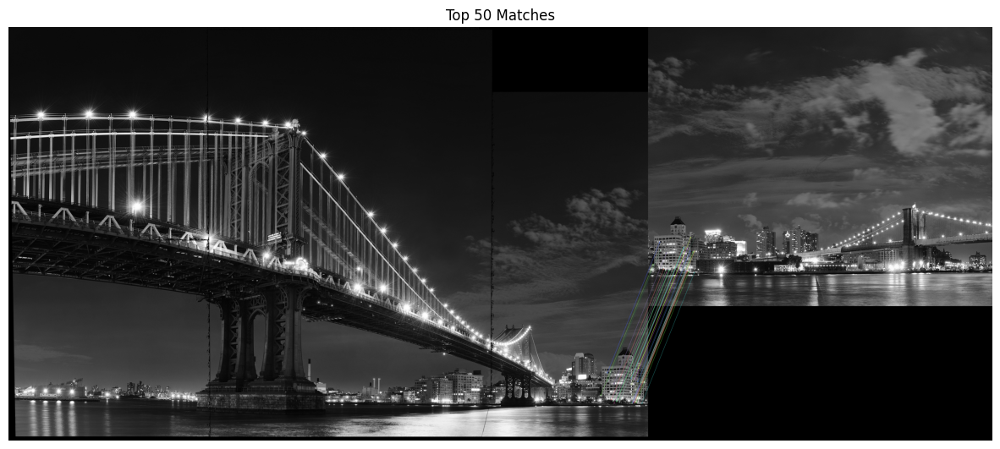

Found 141 inliers for homography.
Homography matrix:
[[ 1.01364856e+00  1.77221222e-03 -3.76736069e+03]
 [-6.25853356e-03  1.03275088e+00 -8.55795406e+02]
 [-4.49077389e-06  1.39034132e-05  1.00000000e+00]]


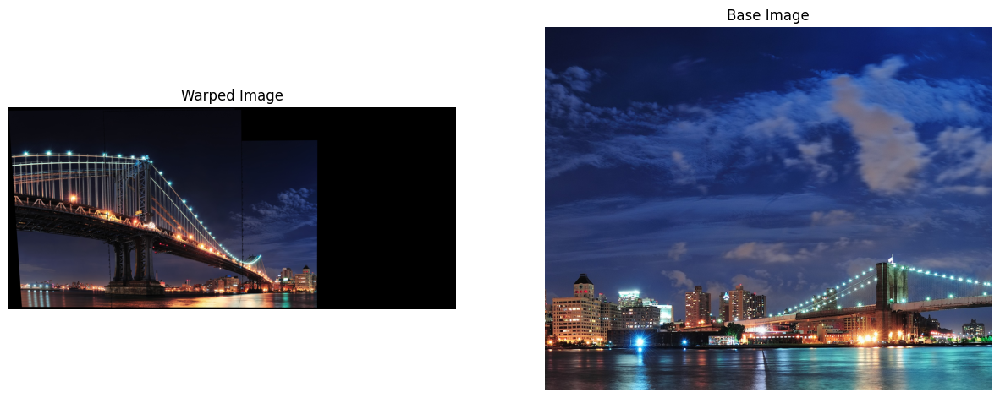

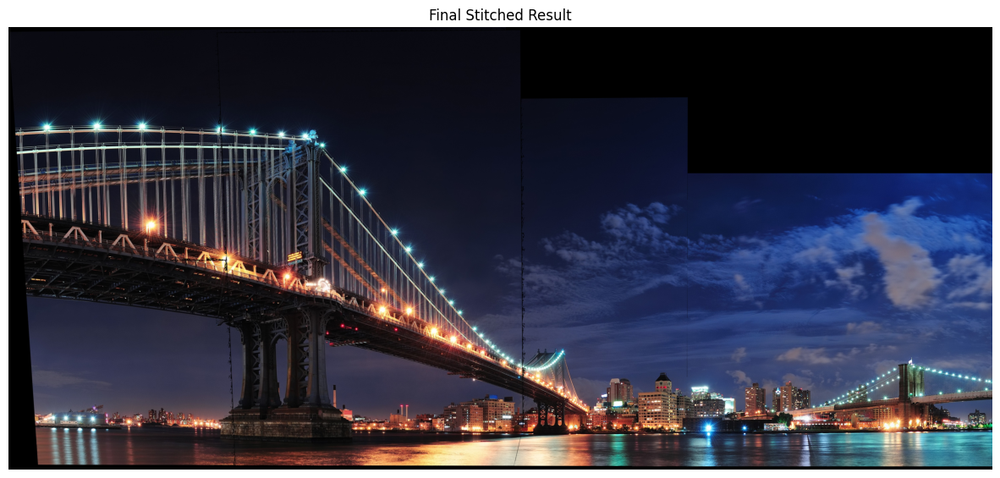


Stitching complete. Final image shape: (2619, 4044, 3)


In [ ]:
# Repeat same process but with image 5
H_12345, _, _, _, _ = find_features_and_homography(
    result_1234,
    nyc_part_five_rgb,
    show_matches=True  # This will plot the top 50 matches
)

if H_12345 is not None:
    # Now we pass both images and the homography to the stitching function
    # It will plot the intermediate and final results because show_steps=True
    result_12345 = stitch_images(
        result_1234,
        nyc_part_five_rgb,
        H_12345,
        show_steps=True
    )

    if result_1234 is not None:
        print(f"\nStitching complete. Final image shape: {result_1234.shape}")
else:
    print("Stitching failed because no homography was found.")

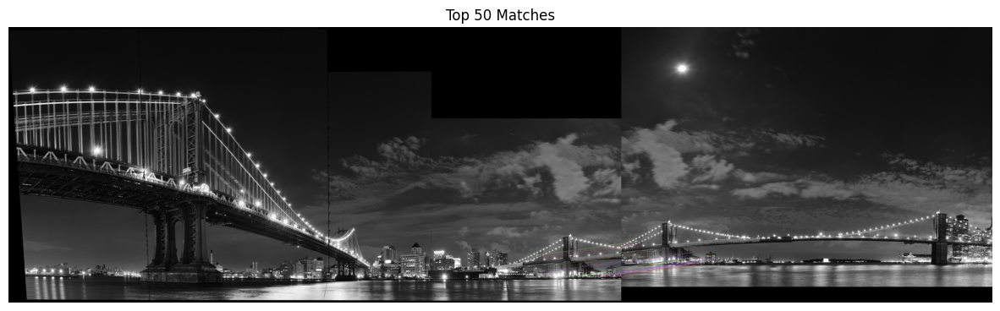

Found 250 inliers for homography.
Homography matrix:
[[ 1.00041951e+00  2.49131101e-03 -4.99154189e+03]
 [-3.32434738e-03  1.01039937e+00 -1.36800078e+02]
 [-1.67275343e-06  4.57364535e-06  1.00000000e+00]]


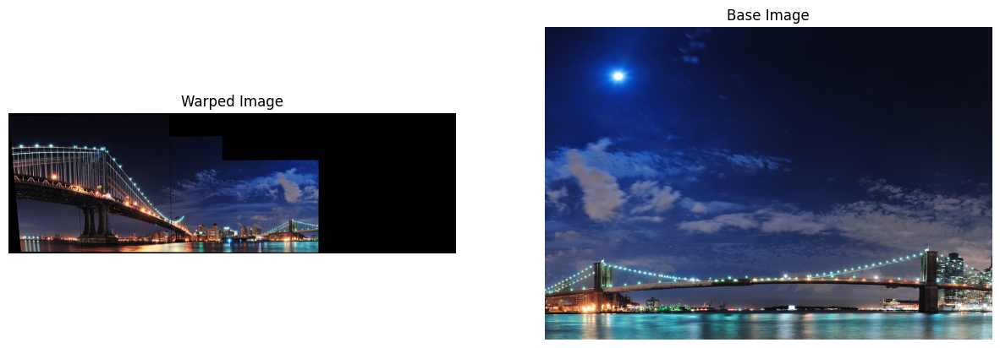

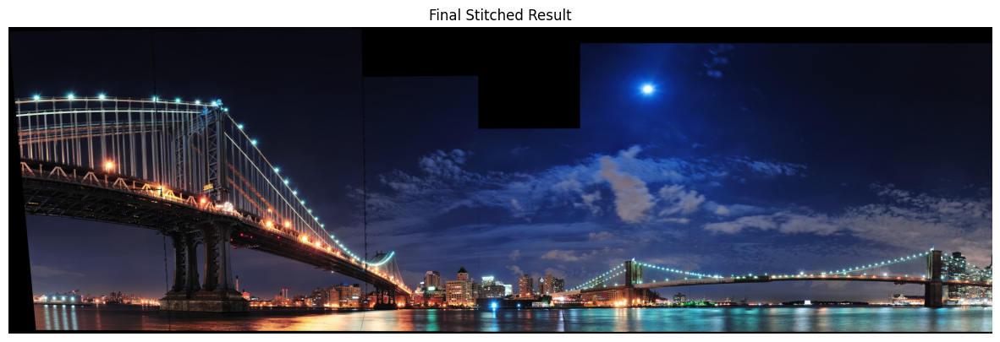


Stitching complete. Final image shape: (2685, 8591, 3)


In [ ]:
# Repeat same process but with image 6
H_123456, _, _, _, _ = find_features_and_homography(
    result_12345,
    nyc_part_six_rgb,
    show_matches=True  # This will plot the top 50 matches
)

if H_123456 is not None:
    # Now we pass both images and the homography to the stitching function
    # It will plot the intermediate and final results because show_steps=True
    result_123456 = stitch_images(
        result_12345,
        nyc_part_six_rgb,
        H_123456,
        show_steps=True
    )

    if result_123456 is not None:
        print(f"\nStitching complete. Final image shape: {result_123456.shape}")
else:
    print("Stitching failed because no homography was found.")

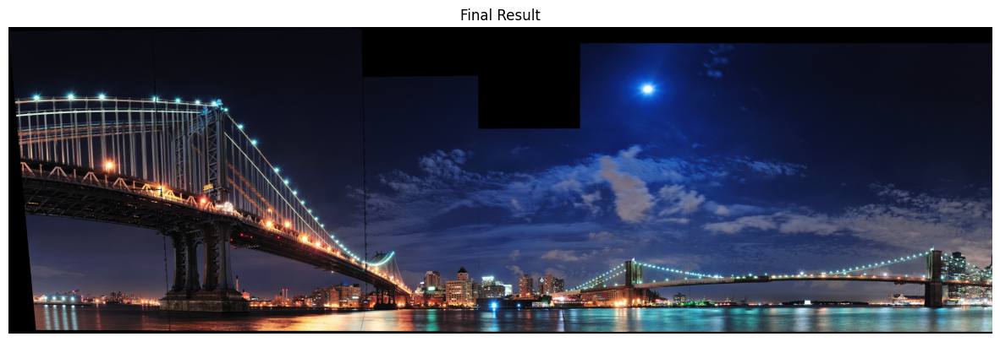

In [ ]:
# Display final image alone:
plt.figure(figsize=(15, 10))
plt.imshow(result_123456)
plt.axis('off')
plt.title('Final Result')
plt.show()

## Question 4

In [ ]:
# Show images with grid
# Load q4 files
q4_folder = "q4_resources"
q4_path = root_path / q4_folder

point_annotations = "point_annotations.json"
point_annotations_path = q4_path / point_annotations


import json
with open(point_annotations_path, 'r') as f:
    data = json.load(f)
for image_key, image_data in data.items():
    filename = image_data['filename']
    file_path = q4_path / filename

    # --- Check if file exists and load it ---
    if not os.path.exists(str(file_path)):
        print(f"--- Skipping {filename}: File not found. ---")
        continue

    image = cv2.imread(str(file_path))
    regions = image_data['regions']

    if image is None:
            print(f"Error loading image: {filename}. Skipping.")
            continue

    # Add region dots to imgage
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for region in regions:
        shape_attributes = region['shape_attributes']
        cx = shape_attributes['cx']
        cy = shape_attributes['cy']
        cv2.circle(image, (cx, cy), 5, (0, 255, 0), -1)

    else:
        # Show image with region dots
        plt.figure(figsize=(15, 10))
        plt.imshow(image)
        plt.title(f'Image: {filename}')


Output hidden; open in https://colab.research.google.com to view.

Image: stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg2625360
Image: premium_photo-1724668625323-ccd85574c6b9.png7110988
Circle center: (1390, 1029)
Image: tigers.jpg73731


(np.float64(-0.5), np.float64(2999.5), np.float64(1999.5), np.float64(-0.5))

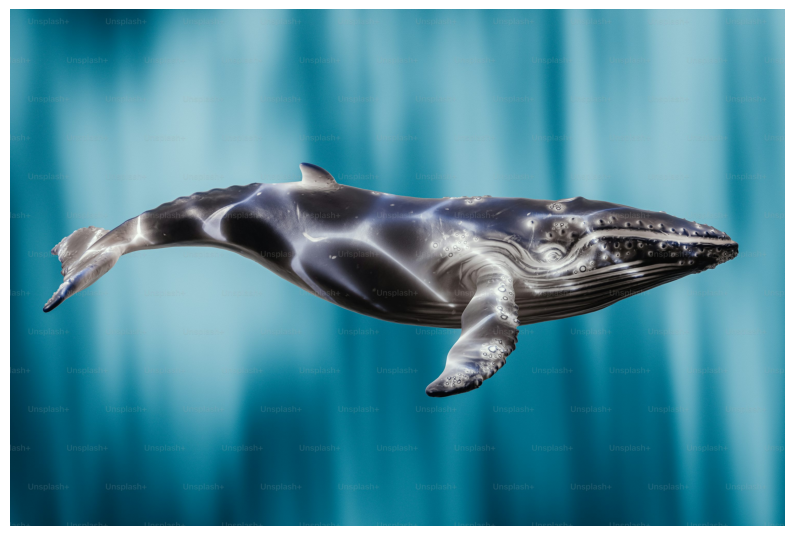

In [ ]:
q4_folder = "q4_resources"
q4_path = root_path / q4_folder
whale_one_path = q4_path / 'premium_photo-1724668625323-ccd85574c6b9.png'

whale_one = cv2.imread(str(whale_one_path), cv2.IMREAD_COLOR)
whale_one = cv2.cvtColor(whale_one, cv2.COLOR_BGR2RGB)

h, w = whale_one.shape[:2]

point_annotations = "point_annotations.json"
point_annotations_path = q4_path / point_annotations

import json
with open(point_annotations_path, 'r') as f:
    annotations = json.load(f)

cx, cy = None, None
for image_key, image_data in annotations.items():
    print(f"Image: {image_key}")

    if image_key != 'premium_photo-1724668625323-ccd85574c6b9.png7110988':
        continue
    for region in image_data['regions']:
        shape_attributes = region['shape_attributes']
        cx = shape_attributes['cx']
        cy = shape_attributes['cy']
        print(f"Circle center: ({cx}, {cy})")


plt.figure(figsize=(10, 10))
plt.imshow(whale_one)
plt.axis('off')

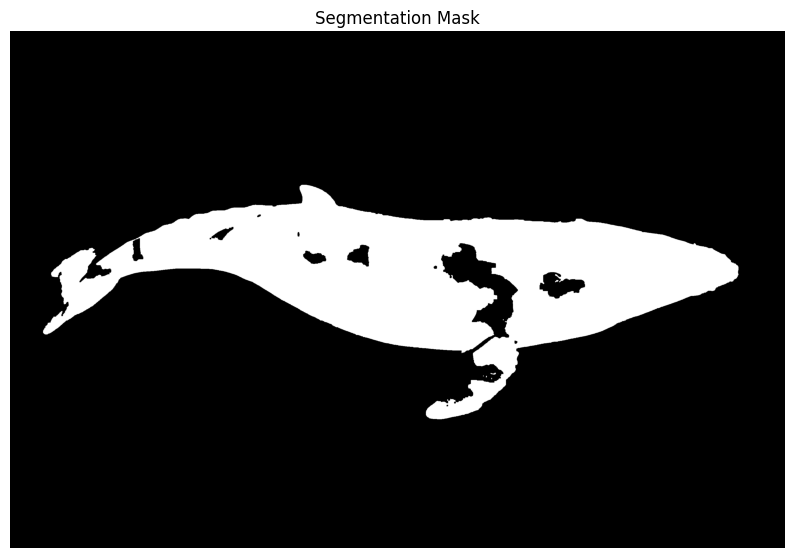

In [ ]:
def grabcut_from_click(bgr, click_xy, fg_radius=8, bg_border=15, iters=5):
    h, w = bgr.shape[:2]
    x, y = int(click_xy[0]), int(click_xy[1])

    # 0: sure BG, 1: sure FG, 2: probable BG, 3: probable FG
    mask = np.full((h, w), cv2.GC_PR_BGD, np.uint8)

    # sure background = frame along the borders
    mask[:bg_border, :] = cv2.GC_BGD
    mask[-bg_border:, :] = cv2.GC_BGD
    mask[:, :bg_border] = cv2.GC_BGD
    mask[:, -bg_border:] = cv2.GC_BGD

    # sure foreground = a small disk around the click
    yy, xx = np.ogrid[:h, :w]
    disk = (xx - x)**2 + (yy - y)**2 <= fg_radius**2
    mask[disk] = cv2.GC_FGD

    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    cv2.grabCut(bgr, mask, None, bgdModel, fgdModel, iters, cv2.GC_INIT_WITH_MASK)

    # final matte
    seg = np.where((mask == cv2.GC_FGD) | (mask == cv2.GC_PR_FGD), 1, 0).astype(np.uint8)

    # small cleanup
    seg = cv2.morphologyEx(seg, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    seg = cv2.morphologyEx(seg, cv2.MORPH_CLOSE, np.ones((5,5), np.uint8))

    return seg  # 1 = foreground, 0 = background


segmentation = grabcut_from_click(whale_one[:, :, ::-1], (cx, cy), fg_radius=50, bg_border=10, iters=10)
plt.figure(figsize=(10, 10))
plt.imshow(segmentation, cmap='gray')
plt.axis('off')
plt.title('Segmentation Mask')
plt.show()

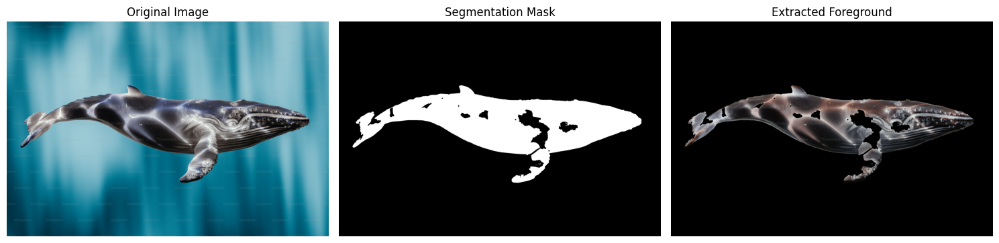

In [ ]:
# --- Convert mask to uint8 ---
mask = (segmentation * 255).astype(np.uint8)

# --- Apply mask to image ---
foreground = cv2.bitwise_and(whale_one, whale_one, mask=mask)

# --- Crop to whale’s bounding box ---
ys, xs = np.where(mask > 0)
y_min, y_max = ys.min(), ys.max()
x_min, x_max = xs.min(), xs.max()
cropped_whale = foreground[y_min:y_max+1, x_min:x_max+1]
cropped_mask = mask[y_min:y_max+1, x_min:x_max+1]

# --- Create transparent PNG (optional) ---
rgba = cv2.cvtColor(cropped_whale, cv2.COLOR_BGR2BGRA)
rgba[:, :, 3] = cropped_mask
cv2.imwrite("whale_transparent.png", rgba)

# --- Plot results ---
fig, axes = plt.subplots(1, 3, figsize=(15, 6))


axes[0].imshow(whale_one)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(mask, cmap="gray")
axes[1].set_title("Segmentation Mask")
axes[1].axis("off")

axes[2].imshow(cv2.cvtColor(foreground, cv2.COLOR_BGR2RGB))
axes[2].set_title("Extracted Foreground")
axes[2].axis("off")

plt.tight_layout()
plt.show()

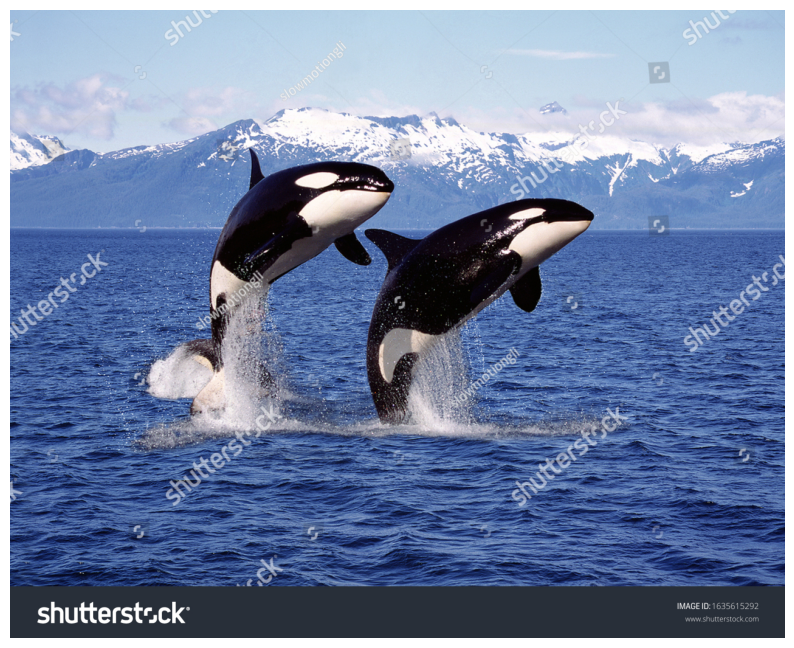

Image: stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg2625360
Circle center: (510, 386)
Circle center: (832, 500)
[510, 832] [386, 500]
Image: premium_photo-1724668625323-ccd85574c6b9.png7110988
Image: tigers.jpg73731


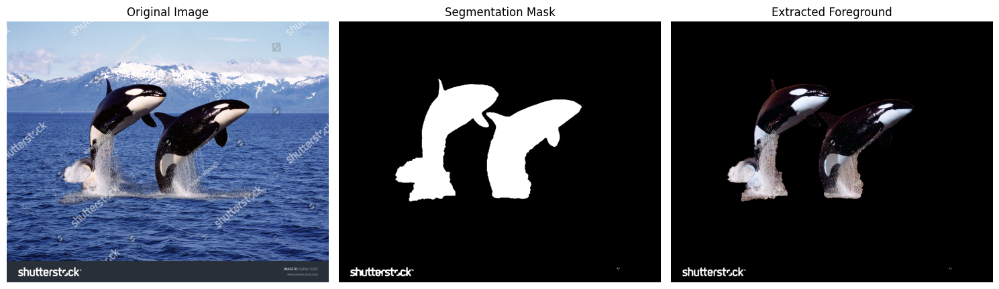

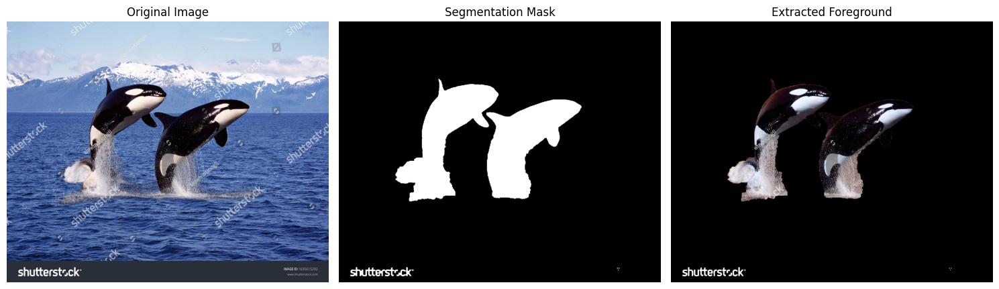

In [ ]:
killer_whale_path = q4_path / 'stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg'

killer_whale = cv2.imread(str(killer_whale_path), cv2.IMREAD_COLOR)
killer_whale = cv2.cvtColor(killer_whale, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(killer_whale)
plt.axis('off')
plt.show()

cx_killer, cy_killer = [], []
for image_key, image_data in annotations.items():
    print(f"Image: {image_key}")

    if image_key != 'stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg2625360':
        continue
    for region in image_data['regions']:
        shape_attributes = region['shape_attributes']
        cx_killer.append(shape_attributes['cx'])
        cy_killer.append(shape_attributes['cy'])
        print(f"Circle center: ({shape_attributes['cx']}, {shape_attributes['cy']})")

    print(cx_killer, cy_killer)


for x, y in zip(cx_killer, cy_killer):

    segmentation_killer = grabcut_from_click(killer_whale[:, :, ::-1], (x, y), fg_radius=40, bg_border=10, iters=10)


    # --- Convert mask to uint8 ---
    mask_killer = (segmentation_killer * 255).astype(np.uint8)

    # --- Apply mask to image ---
    foreground_killer = cv2.bitwise_and(killer_whale, killer_whale, mask=mask_killer)

    # --- Crop to whale’s bounding box ---
    ys_killer, xs_killer = np.where(mask_killer > 0)
    y_min_killer, y_max_killer = ys_killer.min(), ys_killer.max()
    x_min_killer, x_max_killer = xs_killer.min(), xs_killer.max()
    cropped_whale_killer = foreground_killer[y_min_killer:y_max_killer+1, x_min_killer:x_max_killer+1]
    cropped_mask_killer = mask_killer[y_min_killer:y_max_killer+1, x_min_killer:x_max_killer+1]

    # --- Create transparent PNG (optional) ---
    rgba_killer = cv2.cvtColor(cropped_whale_killer, cv2.COLOR_BGR2BGRA)
    rgba_killer[:, :, 3] = cropped_mask_killer
    cv2.imwrite("killer_whale_transparent.png", rgba_killer)

    # --- Plot results ---
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))


    axes[0].imshow(killer_whale)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(mask_killer, cmap="gray")
    axes[1].set_title("Segmentation Mask")
    axes[1].axis("off")

    axes[2].imshow(cv2.cvtColor(foreground_killer, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Extracted Foreground")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()


Image: stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg2625360
Image: premium_photo-1724668625323-ccd85574c6b9.png7110988
Image: tigers.jpg73731
Circle center: (208, 127)
Circle center: (346, 113)
Circle center: (544, 108)
[208, 346, 544] [127, 113, 108]


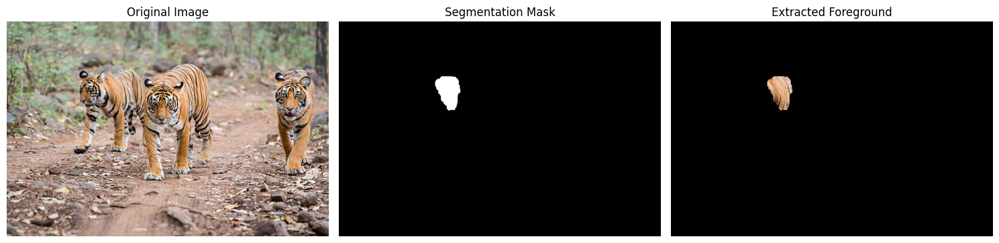

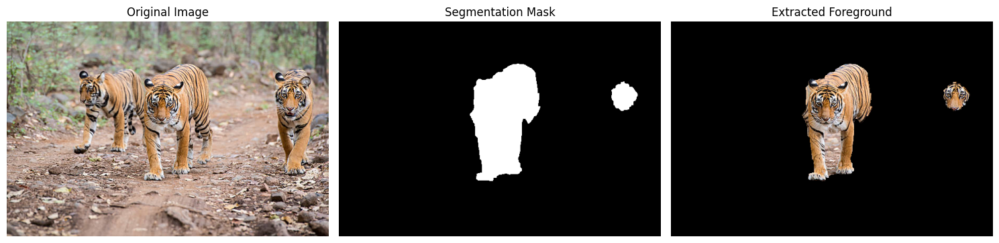

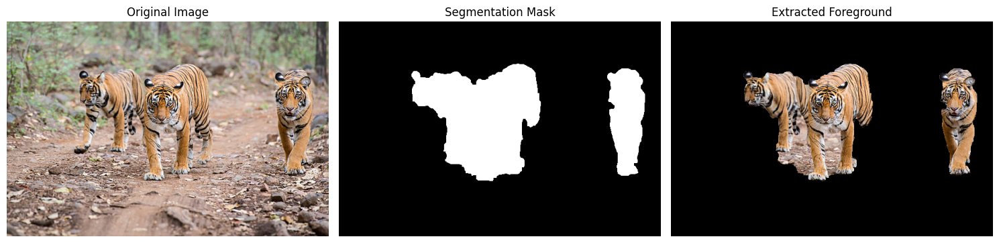

In [ ]:
tigers_path = q4_path / 'tigers.jpg'
tigers =cv2.imread(str(tigers_path ), cv2.IMREAD_COLOR)
cx_tiger, cy_tiger = [], []

for image_key, image_data in annotations.items():
    print(f"Image: {image_key}")

    if image_key != 'tigers.jpg73731':
        continue
    for region in image_data['regions']:
        shape_attributes = region['shape_attributes']
        cx_tiger.append(shape_attributes['cx'])
        cy_tiger.append(shape_attributes['cy'])
        print(f"Circle center: ({shape_attributes['cx']}, {shape_attributes['cy']})")

print(cx_tiger, cy_tiger)

for x, y in zip(cx_tiger, cy_tiger):
    segmentation_tiger = grabcut_from_click(tigers[:, :, ::-1], (x, y), fg_radius=20, bg_border=8, iters=10)


    # --- Convert mask to uint8 ---
    mask_tiger = (segmentation_tiger * 255).astype(np.uint8)

    # --- Apply mask to image ---
    foreground_tiger = cv2.bitwise_and(tigers, tigers, mask=mask_tiger)

    # --- Crop to whale’s bounding box ---
    ys_tiger, xs_tiger = np.where(mask_tiger > 0)
    y_min_tiger, y_max_tiger = ys_tiger.min(), ys_tiger.max()
    x_min_tiger, x_max_tiger = xs_tiger.min(), xs_tiger.max()
    cropped_whale_tiger = foreground_tiger[y_min_tiger:y_max_tiger+1, x_min_tiger:x_max_tiger+1]
    cropped_mask_tiger = mask_tiger[y_min_tiger:y_max_tiger+1, x_min_tiger:x_max_tiger+1]

    # --- Create transparent PNG (optional) ---
    rgba_tiger = cv2.cvtColor(cropped_whale_tiger, cv2.COLOR_BGR2BGRA)
    rgba_tiger[:, :, 3] = cropped_mask_tiger
    cv2.imwrite("tiger_transparent.png", rgba_tiger)

    # --- Plot results ---
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))

    axes[0].imshow(cv2.cvtColor(tigers, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(mask_tiger, cmap="gray")
    axes[1].set_title("Segmentation Mask")
    axes[1].axis("off")

    axes[2].imshow(cv2.cvtColor(foreground_tiger, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Extracted Foreground")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

## Question 5

We will keep the original model (provided to us by the TAs) as a sanity check and a base resource to base ourselves off of. We will begin our own improved version of this in the "Team Model" subsection below. We have a couple of subsections here, Q5 Utils, final model, TA Model, and a separate section where we have some things that we tried but it either produced wose model performance or took too long to run.


### General Q5 Utils

In [1]:
# Get google colab private keys
from google.colab import userdata
import os
import json
from pathlib import Path
kaggle_username = "thiagoviegas"
api_key = userdata.get('KAGGLE_API') # Make sure to have KAGGLE_API name in google colab secret keys

# Dictionary of username, and key
kaggle_dict = {'username': kaggle_username, 'key': api_key}

# Check if "~/.kaggle/" folder exists
if not os.path.exists(os.path.expanduser("~/.kaggle")):
    os.makedirs(os.path.expanduser("~/.kaggle"))

# Save kaggle_dict to "~/.kaggle/kaggle.json"
with open(os.path.expanduser("~/.kaggle/kaggle.json"), 'w') as f:
    json.dump(kaggle_dict, f)

# chmod 600 the kaggle.json file
!chmod 600 ~/.kaggle/kaggle.json

In [2]:
!kaggle competitions download -c cell-segmentation-cs-gy-6643


 53% 165M/311M [00:00<00:00, 1.72GB/s]
100% 311M/311M [00:00<00:00, 1.73GB/s]


In [3]:
!ls -lh /content


total 312M
-rw-r--r-- 1 root root 312M Oct 18 00:23 cell-segmentation-cs-gy-6643.zip
drwxr-xr-x 1 root root 4.0K Oct 30 13:36 sample_data


In [4]:
# Unzip the competition archive again into data_folder/
!unzip -q cell-segmentation-cs-gy-6643.zip -d data_folder

# Quick check: list top-level contents
!ls -lh data_folder


total 11M
drwxr-xr-x 2 root root 4.0K Oct 31 22:21 test_final
drwxr-xr-x 2 root root  20K Oct 31 22:21 train
-rw-r--r-- 1 root root  11M Oct 18 00:23 train_ground_truth.csv


In [5]:
# Connect drive and get validation data from folder
from google.colab import drive
drive.mount('/content/drive')

root_folder = "/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 2" # @param {type: "string"}

root_path = Path(root_folder)

q5_folder = "q5_resources"
q5_path = root_path / q5_folder


# Move to val.zip at val_data_path to /content/data_folder
!cp "/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 2/q5_resources/val.zip" /content/


Mounted at /content/drive


In [6]:
!unzip -q val.zip -d data_folder/val

In [7]:
!rm data_folder/slide*

rm: cannot remove 'data_folder/slide*': No such file or directory


In [8]:
!pip install -q opencv-python scikit-image pandas tqdm
# --- Standard Library Imports ---
import copy
import math
import os
import random
import zipfile
import xml.etree.ElementTree as ET
from pathlib import Path

# --- Third-Party Imports ---

# PyTorch Core
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset, random_split, Subset

# TorchVision
import torchvision
from torchvision.models.detection import (
    MaskRCNN_ResNet50_FPN_Weights,
    maskrcnn_resnet50_fpn,
)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.transforms import functional as TF

# Data Science and Image Processing
import cv2
import numpy as np
import pandas as pd
from scipy import ndimage
from skimage import draw
from skimage.measure import label as cc_label

# Utilities
import matplotlib.pyplot as plt
from tqdm import tqdm
print("✅ All packages installed!")

✅ All packages installed!


In [9]:
# Paths (you already unzipped to data_folder)
BASE = Path("data_folder")
TRAIN_DIR = BASE / "train"
TEST_DIR  = BASE / "test_final"
VAL_DIR   = BASE / "val"

# Hyperparameters
CLASSES = ["Epithelial","Lymphocyte","Neutrophil","Macrophage"]
IMG_SIZE = 320        # small & fast; bump for quality
BATCH_SIZE = 4
EPOCHS = 3            # quick demo; bump to 15–30 for results
LR = 1e-3
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)


Device: cuda


In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
def parse_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    annotations = []

    for annotation in root.findall('Annotation'):
        cell_type = None
        attributes = annotation.find('Attributes')
        if attributes is not None:
            attribute = attributes.find('Attribute')
            if attribute is not None:
                cell_type = attribute.get('Name')

        if not cell_type:
            continue

        regions_element = annotation.find('Regions')
        if regions_element is not None:
            regions = regions_element.findall('Region')

            for region in regions:
                vertices = []
                vertices_element = region.find('Vertices')

                if vertices_element is not None:
                    for vertex in vertices_element.findall('Vertex'):
                        x = float(vertex.get('X'))
                        y = float(vertex.get('Y'))
                        vertices.append((x, y))

                if vertices:
                    annotations.append({
                        'cell_type': cell_type,
                        'vertices': vertices
                    })

    return annotations

def generate_masks(image_shape, annotations):
    height, width = image_shape[:2]

    masks = {
        'Epithelial': np.zeros((height, width), dtype=np.uint16),
        'Lymphocyte': np.zeros((height, width), dtype=np.uint16),
        'Neutrophil': np.zeros((height, width), dtype=np.uint16),
        'Macrophage': np.zeros((height, width), dtype=np.uint16)
    }

    instance_id = {
        'Epithelial': 1,
        'Lymphocyte': 1,
        'Neutrophil': 1,
        'Macrophage': 1
    }

    for ann in annotations:
        cell_type = ann['cell_type']
        if cell_type in masks:
            vertices = np.array(ann['vertices'])
            rr, cc = draw.polygon(vertices[:, 1], vertices[:, 0], shape=(height, width))
            masks[cell_type][rr, cc] = instance_id[cell_type]
            instance_id[cell_type] += 1

    return masks

def rle_encode(mask):
    pixels = mask.flatten(order="F").astype(np.int32)
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1

    rle_parts = []
    for i in range(len(runs)-1):
        start = runs[i]
        end = runs[i+1] if i+1 < len(runs) else len(pixels)-1
        length = end - start
        value = pixels[start]

        if value > 0:
            rle_parts.extend([value, start, length])

    return ' '.join(str(x) for x in rle_parts) if rle_parts else ""

def rle_decode(mask_rle, shape):
    if isinstance(mask_rle, float) and np.isnan(mask_rle):
        return np.zeros(shape, dtype=np.uint16)

    if not mask_rle or mask_rle.strip() == '':
        return np.zeros(shape, dtype=np.uint16)

    s = str(mask_rle).split()
    if len(s) == 0 or len(s) % 3 != 0:
        return np.zeros(shape, dtype=np.uint16)

    img = np.zeros(shape[0] * shape[1], dtype=np.uint16)

    for i in range(0, len(s), 3):
        value = int(s[i])
        start = int(s[i+1]) - 1
        length = int(s[i+2])
        img[start:start+length] = value

    return img.reshape(shape, order='F')

In [12]:
class CellMaskDataset(Dataset):
    """
    Returns:
      image: Tensor[C,H,W] (float 0..1)
      target: dict with keys:
        'boxes': FloatTensor[N,4] in (x1,y1,x2,y2)
        'labels': Int64Tensor[N] in 1..num_classes
        'masks': UInt8Tensor[N,H,W] binary masks (0/1)
        'image_id': Int64Tensor[1]
        'area': FloatTensor[N]
        'iscrowd': Int64Tensor[N] (usually zeros)
    """
    def __init__(self, data_dir, classes=CLASSES, transforms=None):
        self.data_dir = Path(data_dir)
        self.xml_files = list(self.data_dir.glob("*.xml"))
        self.classes = classes
        self.transforms = transforms

    def __len__(self):
        return len(self.xml_files)

    def __getitem__(self, idx):
        xml_path = self.xml_files[idx]
        img_path = xml_path.with_suffix('.tif')
        image = cv2.imread(str(img_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        H, W = image.shape[:2]

        # parse XML and get per-class instance map (uint16, different ints for instances)
        annotations = parse_xml(xml_path)
        masks_by_class = generate_masks((H, W, 3), annotations)  # same function you have

        masks_list = []
        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for cls_idx, cls_name in enumerate(self.classes):
            inst_map = masks_by_class[cls_name]  # uint16 array, 0=background
            unique_ids = np.unique(inst_map)
            unique_ids = unique_ids[unique_ids != 0]
            for inst_id in unique_ids:
                bin_mask = (inst_map == inst_id).astype(np.uint8)
                # compute bbox (x1,y1,x2,y2)
                ys, xs = np.where(bin_mask)
                if len(xs) == 0 or len(ys) == 0:
                    continue
                x1 = float(xs.min())
                x2 = float(xs.max())
                y1 = float(ys.min())
                y2 = float(ys.max())
                boxes.append([x1, y1, x2, y2])
                masks_list.append(bin_mask)
                labels.append(cls_idx + 1)  # 1-based labels
                areas.append(float(bin_mask.sum()))
                iscrowd.append(0)

        if len(boxes) == 0:
            # return empty target (valid form)
            boxes = torch.zeros((0,4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            masks = torch.zeros((0, H, W), dtype=torch.uint8)
            areas = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            masks = torch.as_tensor(np.stack(masks_list, axis=0), dtype=torch.uint8)
            areas = torch.as_tensor(areas, dtype=torch.float32)
            iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        image_tensor = TF.to_tensor(image)  # converts to float tensor C,H,W scaled 0..1

        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": masks,
            "image_id": torch.tensor([idx]),
            "area": areas,
            "iscrowd": iscrowd
        }

        if self.transforms:
            image_tensor, target = self.transforms(image_tensor, target)

        return image_tensor, target

In [13]:
def collate_fn(batch):
    images, targets = zip(*batch)
    return list(images), list(targets)

In [14]:
def dice_loss(pred, target, smooth=1e-5):
    pred = pred.contiguous()
    target = target.contiguous()

    intersection = (pred * target).sum(dim=2).sum(dim=2)
    loss = (1 - ((2. * intersection + smooth) /
                 (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + smooth)))

    return loss.mean()

In [15]:
def predict_test_set(model, test_dir, device, threshold=0.5):
    model = model.to(device)
    model.eval()

    test_tif_files = list(Path(test_dir).glob("*.tif"))
    submission_rows = []

    print(f"\nPredicting on {len(test_tif_files)} test images...")

    with torch.no_grad():
        for tif_file in tqdm(test_tif_files):
            image = cv2.imread(str(tif_file))
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            original_shape = image_rgb.shape[:2]

            image_resized = cv2.resize(image_rgb, (IMG_SIZE, IMG_SIZE))
            image_norm = image_resized.astype(np.float32) / 255.0
            image_tensor = torch.from_numpy(np.transpose(image_norm, (2, 0, 1))).unsqueeze(0).to(device)

            output = model(image_tensor)
            output = output.squeeze(0).cpu().numpy()

            instance_masks = {}
            for i, cell_type in enumerate(CLASSES):
                mask = output[i]
                mask = cv2.resize(mask, (original_shape[1], original_shape[0]))
                binary_mask = (mask > threshold).astype(np.uint8)

                labeled_mask, _ = ndimage.label(binary_mask)
                instance_masks[cell_type] = labeled_mask.astype(np.uint16)

            image_id = tif_file.stem
            row = {'image_id': image_id}

            for cell_type in CLASSES:
                mask = instance_masks[cell_type]
                row[cell_type] = rle_encode(mask) if np.max(mask) > 0 else ""

                # If row[cell_type] is empty, add a 0
                if not row[cell_type]:
                    row[cell_type] = 0

            submission_rows.append(row)

    return pd.DataFrame(submission_rows)

#### Single Image Visualization Util
The above classes do not create a simple visualization tool for a single image so we can create one as a sanity check and to view flaws in model.

In [16]:
def analyze_and_visualize_masks(image_path, model, ground_truth_df, image_size=IMG_SIZE, device=DEVICE, score_thresh=0.5, mask_thresh=0.5):
    """
    Loads an image, runs inference with the model, decodes ground truth masks,
    and visualizes both predicted and ground truth masks.

    Args:
        image_path (Path): Path to the image file.
        model (torch.nn.Module): Trained segmentation model (Mask R-CNN).
        ground_truth_df (pd.DataFrame): DataFrame containing ground truth RLEs, indexed by image_id.
        image_size (int): The size to resize the image for model input (optional, depends on model training).
        device (str): The device to run inference on ('cuda' or 'cpu').
        score_thresh (float): Minimum score to consider a predicted instance.
        mask_thresh (float): Threshold for binarizing predicted mask probabilities.
    """
    # --- Load and preprocess image for inference ---
    image = cv2.imread(str(image_path))
    if image is None:
        print(f"Error loading image: {image_path}. Skipping analysis.")
        return

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    original_shape = image_rgb.shape[:2] # (H, W)

    # Prepare input tensor (optionally resize to model input size)
    # Mask R-CNN handles resizing internally if not provided, but providing it
    # might align better if the model was trained on a specific fixed size.
    # However, the current Mask R-CNN model uses FPN and resizing is handled
    # by the model's transform. Let's use the model's default transform.
    image_tensor = TF.to_tensor(image_rgb).to(device)


    # --- Run Inference ---
    model.eval()
    outputs = None
    with torch.no_grad():
        # Mask R-CNN returns a list of outputs, one for each image in the batch
        outputs = model([image_tensor])[0] # Get the output for the first (and only) image

    if outputs is None:
        print("Inference failed. Could not generate predicted masks.")
        return

    # Extract predictions
    pred_masks_tensor = outputs.get('masks') # Tensor [N, 1, H', W'] or [N, H', W']
    pred_labels_tensor = outputs.get('labels') # Tensor [N]
    pred_scores_tensor = outputs.get('scores') # Tensor [N]

    if pred_masks_tensor is None or pred_labels_tensor is None or pred_scores_tensor is None:
         print("No detections found by the model.")
         predicted_masks_by_class = {c: np.zeros(original_shape, dtype=np.uint8) for c in CLASSES}
    else:
        # Ensure masks shape is [N, H, W]
        if pred_masks_tensor.ndim == 4:
            pred_masks_tensor = pred_masks_tensor.squeeze(1) # -> [N, H', W']

        # Process predictions and create per-class binary masks
        predicted_masks_by_class = {c: np.zeros(original_shape, dtype=np.uint8) for c in CLASSES}

        for i in range(pred_masks_tensor.shape[0]):
            score = float(pred_scores_tensor[i].cpu().item())
            if score < score_thresh:
                continue

            label = int(pred_labels_tensor[i].cpu().item()) # 1..num_classes-1
            if label == 0 or label > len(CLASSES): # Skip background and invalid labels
                continue
            cls_name = CLASSES[label - 1]

            mask_prob = pred_masks_tensor[i].cpu().numpy() # H', W'
            # Resize mask back to original image size
            mask_resized = cv2.resize(mask_prob, (original_shape[1], original_shape[0])) # note width,height order

            binary_mask = (mask_resized > mask_thresh).astype(np.uint8)

            # For visualization, we just need a single binary mask per class showing all instances
            predicted_masks_by_class[cls_name][binary_mask > 0] = 1


    # --- Get and decode Ground Truth ---
    image_id = image_path.stem
    masks_ground_truth = None
    if image_id not in ground_truth_df.index:
        print(f"Ground truth not found for image: {image_id}.")
    else:
        slide_ground_truth = ground_truth_df.loc[image_id].to_dict()
        masks_ground_truth = {}
        for cell_type in CLASSES:
            rle = slide_ground_truth.get(cell_type, "") # Use .get with default empty string
            mask = rle_decode(rle, original_shape) # uint16 instance mask
            # Convert to binary mask for visualization (0/1)
            masks_ground_truth[cell_type] = (mask > 0).astype(np.uint8)


    # --- Visualize Results ---
    num_cols = len(CLASSES) + 1
    fig, axs = plt.subplots(2, num_cols, figsize=(5 * num_cols, 10))

    # Display original image
    axs[0][0].imshow(image_rgb)
    axs[0][0].set_title("Original Image")
    axs[0][0].axis('off')
    axs[1][0].imshow(image_rgb) # Also show original in the second row for alignment
    axs[1][0].set_title("Original Image")
    axs[1][0].axis('off')


    # Display predicted masks
    for i, cell_type in enumerate(CLASSES):
        binary_mask = predicted_masks_by_class[cell_type]

        colored_mask = np.zeros_like(image_rgb)
        if cell_type == 'Epithelial':
            color = (255, 0, 0) # Red
        elif cell_type == 'Lymphocyte':
            color = (0, 255, 0) # Green
        elif cell_type == 'Neutrophil':
            color = (0, 0, 255) # Blue
        elif cell_type == 'Macrophage':
            color = (255, 255, 0) # Yellow
        colored_mask[binary_mask > 0] = color

        overlaid_image = cv2.addWeighted(image_rgb, 1 - 0.5, colored_mask, 0.5, 0)
        axs[0][i+1].imshow(overlaid_image)
        axs[0][i+1].set_title(f'{cell_type} Predicted')
        axs[0][i+1].axis('off')


    # Display ground truth masks if available
    if masks_ground_truth:
        for i, cell_type in enumerate(CLASSES):
            binary_mask = masks_ground_truth[cell_type]

            colored_mask = np.zeros_like(image_rgb)
            if cell_type == 'Epithelial':
                color = (255, 0, 0) # Red
            elif cell_type == 'Lymphocyte':
                color = (0, 255, 0) # Green
            elif cell_type == 'Neutrophil':
                color = (0, 0, 255) # Blue
            elif cell_type == 'Macrophage':
                color = (255, 255, 0) # Yellow
            colored_mask[binary_mask > 0] = color

            overlaid_image = cv2.addWeighted(image_rgb, 1 - 0.5, colored_mask, 0.5, 0)
            axs[1][1 + i].imshow(overlaid_image)
            axs[1][1 + i].set_title(f'{cell_type} Ground Truth')
            axs[1][1 + i].axis('off')
    else:
        # If no ground truth, hide the second row axes for ground truth masks
        for i in range(len(CLASSES)):
             axs[1][i+1].axis('off')


    plt.tight_layout()
    plt.show()

### Submission Model
Our final model uses the following:
1.  Utilize Deep Residual Learning [(He et al., 2015)](https://arxiv.org/abs/1512.03385) and using *pre-trained ResNet encoder* to improve feature detection. Here, we will use resnet-50 as part of our encoder structrue to take advantage of the pretrained weights that improve feature detection.

Implementation steps: Resnet has
many layers
![Alt Text](https://towardsdatascience.com/wp-content/uploads/2022/08/0mQA4WKBXkvE-Atjn.png)

"Hijacking" the model before the max pool.


2.  Add rotation invariance to the model by augmenting the dataset to include rotations of the original data. U-Nets are not rotationally invariant by design, one thing we can do to compensate for this is by augmenting our data by adding rotated versions of the images in order to create different and new training data for the model to learn from.


3. Our encoder structure will utilize the resnet weights and the overall structure of the model will follow a traditioan Mask R-CNN as constructed by PyTorch. This will allow us to properly utilize the pre-trained weights of the ResNet while also implementing a strong loss function that comes as the base of PyTorch Mask R-CNN models.

4. The implemented loss function extends that of the Dice Loss (used in the TA example) and has the following components:
    
    The losses parameters are :
    * RPN Losses (Region Proposal Network): Objectness Loss: A binary cross-entropy loss applied to each anchor box to classify whether it contains an object or not.
    * RPN Box Regression Loss: A Smooth L1 loss applied to refine the bounding box coordinates of the proposed regions.
    * R-CNN Losses (Region-based Convolutional Neural Network): Classifier Loss: A cross-entropy loss for classifying the object within each Region of Interest (RoI) into one of the predefined classes.
    * Box Regression Loss: A Smooth L1 loss to further refine the bounding box coordinates of the detected objects.
    * Mask Loss: A binary cross-entropy loss applied per-pixel to predict the segmentation mask for each detected object.

    This provides an incedibly robust loss function of many componets that are important to geting a higher accuracy. There is potential improvement to this loss function that could be made but we would need more expertise to proprly optimize the provided loss function for this particular task.

5. The model was originally trained on 90% of the data with 10% left for validation, but since more data was created we simpoly utilize 100% of the data to train and run validation on the additional dataset.

In [17]:
# Function utilize to get and build or Mask R-CNN model with a ResNet50 backbone (encoder weights) and a Fast RCNN predictor
def get_maskrcnn_model(num_classes):
    # num_classes includes background (so 5 for 4 cell types + bg)
    model = maskrcnn_resnet50_fpn(weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT, pretrained=True)

    # Replace the region of interest box predictor to map the in_features of the final layer to our expected number of classes.
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Replace the region of interest mask predictor to map the last feature mask to our classees, adding a hidden layer in between both to create some area for fine-tuning.
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)
    return model

In [18]:
def train_model(model, optimizer, train_loader, device, num_epochs,
                print_freq=10, val_loader=None, best_path='best_model.pth'):
    """
    Train a Mask R-CNN model with optional validation.
    Saves the best model (lowest val loss) to `best_path`.
    """
    best_loss = float('inf')
    best_epoch = -1

    for epoch in range(num_epochs):
        print(f"\n===== Epoch {epoch+1}/{num_epochs} =====")
        model.train()
        epoch_loss = 0.0

        for i, (images, targets) in enumerate(train_loader):
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            epoch_loss += losses.item()

            if i % print_freq == 0:
                print(f"  [train] iter {i}/{len(train_loader)} loss: {losses.item():.4f}")

        avg_train_loss = epoch_loss / len(train_loader)
        print(f"  → Avg train loss: {avg_train_loss:.4f}")

        # ----------------- VALIDATION -----------------
        if val_loader is not None:
            model.train()
            val_loss = 0.0
            with torch.no_grad():
                for images, targets in val_loader:
                    images = [img.to(device) for img in images]
                    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
                    loss_dict = model(images, targets)
                    losses = sum(loss for loss in loss_dict.values())
                    val_loss += losses.item()

            avg_val_loss = val_loss / len(val_loader)
            print(f"  → Avg val loss: {avg_val_loss:.4f}")


            # Save model if validation improved
            if avg_val_loss < best_loss:
                best_loss = avg_val_loss
                torch.save(model.state_dict(), best_path)
                best_epoch = epoch
                print(f"  ✅ Best model saved ({best_loss:.4f})")
        else:
            # If no val loader, still save best based on training loss
            if avg_train_loss < best_loss:
                best_loss = avg_train_loss
                torch.save(model.state_dict(), best_path)
                print(f"  ✅ Best model saved ({best_loss:.4f})")

    print(f"\nTraining complete. Best loss: {best_loss:.4f}")
    return best_loss


In [21]:
NUM_CLASSES = len(CLASSES) + 1

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# Load test and validation datasets
dataset = CellMaskDataset(TRAIN_DIR, classes=CLASSES)
validation_set = CellMaskDataset(VAL_DIR, classes=CLASSES)

#randomize data

# Create iterable of data
train_loader = DataLoader(dataset, batch_size=2, shuffle=True, num_workers=0, collate_fn=collate_fn)
val_loader = DataLoader(validation_set, batch_size=2, shuffle=False, num_workers=0, collate_fn=collate_fn)

# Get base model (no fine-tuning)
model = get_maskrcnn_model(NUM_CLASSES).to(DEVICE)
params = [p for p in model.parameters() if p.requires_grad]
# Tried both Adam and SGD, classic SGD, and Momentum SGD and Momentum SGD turned out to end at a better performance and generalization
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

best_path = "best_model.pth"
NUM_EPOCHS = 10
train_model(model, optimizer, train_loader, DEVICE, NUM_EPOCHS, print_freq=10,
            val_loader=val_loader, best_path=best_path)  # make sure train_model does val & saves best

# Load best and run on TEST_DIR to produce submission
model.load_state_dict(torch.load(best_path, map_location=DEVICE))



===== Epoch 1/10 =====
  [train] iter 0/105 loss: 6.3558
  [train] iter 10/105 loss: 2.0750
  [train] iter 20/105 loss: 1.6470
  [train] iter 30/105 loss: 1.2837
  [train] iter 40/105 loss: 1.1105
  [train] iter 50/105 loss: 0.9510
  [train] iter 60/105 loss: 1.5602
  [train] iter 70/105 loss: 1.6332
  [train] iter 80/105 loss: 0.9923
  [train] iter 90/105 loss: 0.6294
  [train] iter 100/105 loss: 1.0661
  → Avg train loss: 1.5241
  → Avg val loss: 1.0385
  ✅ Best model saved (1.0385)

===== Epoch 2/10 =====
  [train] iter 0/105 loss: 0.9151
  [train] iter 10/105 loss: 1.5012
  [train] iter 20/105 loss: 1.0549
  [train] iter 30/105 loss: 1.0191
  [train] iter 40/105 loss: 0.9371
  [train] iter 50/105 loss: 0.8089
  [train] iter 60/105 loss: 0.6178
  [train] iter 70/105 loss: 0.9865
  [train] iter 80/105 loss: 0.8622
  [train] iter 90/105 loss: 1.1983
  [train] iter 100/105 loss: 1.0448
  → Avg train loss: 1.0249
  → Avg val loss: 0.9657
  ✅ Best model saved (0.9657)

===== Epoch 3/10 

<All keys matched successfully>

In [22]:
def predict_maskrcnn_test_set(model, test_dir, device, score_thresh=0.5, mask_thresh=0.5, resize_to=None):
    """
    Run Mask R-CNN on test images and produce a DataFrame like your submission format:
      columns = ['image_id', 'Epithelial', 'Lymphocyte', 'Neutrophil', 'Macrophage']

    Args:
      model: Mask R-CNN (already loaded & in eval mode).
      test_dir: path-like to folder with .tif test images (use TEST_DIR).
      device: 'cuda' or 'cpu'.
      score_thresh: min detection score to keep instance.
      mask_thresh: threshold to binarize predicted mask probs.
      resize_to: if model was trained on resized images, pass int (e.g., IMG_SIZE). If None, predicts at original size.
    """
    # If model not on device put on device
    if next(model.parameters()).is_cuda:
        model = model.to(device)

    # If model not in eval mode, put in eval mode
    if model.training:
        model.eval()

    test_tif_files = list(Path(test_dir).glob("*.tif"))
    rows = []

    for tif_file in tqdm(test_tif_files, desc="Predicting test images"):
        img = cv2.imread(str(tif_file))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        orig_h, orig_w = img_rgb.shape[:2]

        # Prepare input tensor (optionally resize to model input size)
        if resize_to is not None:
            img_in = cv2.resize(img_rgb, (resize_to, resize_to))
        else:
            img_in = img_rgb

        img_tensor = TF.to_tensor(img_in).to(device)

        with torch.no_grad():
            outputs = model([img_tensor])[0]

        # outputs: dict with keys 'boxes','labels','scores','masks'
        masks = outputs.get('masks')          # Tensor [N,1,H,W] or [N,H,W] depending on torchvision
        labels = outputs.get('labels')        # Tensor [N]
        scores = outputs.get('scores')        # Tensor [N]

        # Ensure masks shape is [N, H, W]
        if masks is None:
            # No masks predicted
            per_class_map = {c: np.zeros((orig_h, orig_w), dtype=np.uint16) for c in CLASSES}
        else:
            if masks.ndim == 4:
                masks = masks.squeeze(1)      # -> [N, H, W]

            N = masks.shape[0]
            per_class_map = {c: np.zeros((orig_h, orig_w), dtype=np.uint16) for c in CLASSES}
            inst_counters = {c: 1 for c in CLASSES}

            for i in range(N):
                score = float(scores[i].cpu().item())
                if score < score_thresh:
                    continue

                label = int(labels[i].cpu().item())   # 1..num_classes-1
                if label == 0:
                    continue
                cls_name = CLASSES[label - 1]

                mask_prob = masks[i].cpu().numpy()
                # If we resized input for the model, resize mask back to original image size
                if resize_to is not None and (mask_prob.shape[0] != orig_h or mask_prob.shape[1] != orig_w):
                    mask_prob = cv2.resize(mask_prob, (orig_w, orig_h))  # note width,height order

                bin_mask = (mask_prob > mask_thresh).astype(np.uint8)
                if bin_mask.sum() == 0:
                    continue

                inst_id = inst_counters[cls_name]
                per_class_map[cls_name][bin_mask == 1] = inst_id
                inst_counters[cls_name] += 1

        # Build a submission row
        image_id = tif_file.stem
        row = {'image_id': image_id}
        for cls in CLASSES:
            mask = per_class_map[cls]
            rle = rle_encode(mask) if mask.max() > 0 else ""
            # following your notebook convention: convert empty to 0
            if not rle:
                rle = 0
            row[cls] = rle

        rows.append(row)

    return pd.DataFrame(rows)

In [23]:
# Recreate model architecture and load checkpoint
NUM_CLASSES = len(CLASSES) + 1

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
# If model not in variables load best model
if 'model' not in locals():
    model = get_maskrcnn_model(NUM_CLASSES)
    model.load_state_dict(torch.load('best_model.pth'))


# Put model in eval mode
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [24]:
submission_df = predict_maskrcnn_test_set(model, TEST_DIR, DEVICE,
                                         score_thresh=0.5, mask_thresh=0.5,
                                         resize_to=None)  # or resize_to=IMG_SIZE if you trained on resized input

# (optional) sort by slide number like you did previously:
submission_df['slide_num'] = submission_df['image_id'].str.extract(r'(\d+)$').astype(int)
submission_df = submission_df.sort_values('slide_num').drop(columns=['slide_num'])

submission_df.to_csv('submission.csv', index=False)
print("Saved submission.csv — shape:", submission_df.shape)
submission_df.head()

Predicting test images: 100%|██████████| 40/40 [00:08<00:00,  4.66it/s]

Saved submission.csv — shape: (40, 5)


,image_id,Epithelial,Lymphocyte,Neutrophil,Macrophage
2,slide1,0,1 31121 5 1 31275 10 1 31431 13 1 31587 15 1 3...,1 30964 4 1 31118 10 1 31273 14 1 31429 16 1 3...,3 2163 19 3 2316 26 3 2471 29 3 2626 32 3 2782...
17,slide2,0,47 1539 11 47 2488 13 47 3437 15 10 4277 8 47 ...,0,0
5,slide3,0,90 14509 9 90 15074 13 90 15640 14 90 16206 16...,0,0
18,slide4,0,0,2 1922 14 2 2053 19 2 2186 22 2 2318 25 2 2451...,3 1421 18 3 1552 24 3 1686 26 2 1787 16 3 1818...
35,slide5,61 16137 14 61 18284 20 61 20431 25 61 22579 2...,0,0,0


In [26]:
#download csv
from google.colab import files
files.download('submission.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Load the ground truth CSV
ground_truth_path = BASE / "train_ground_truth.csv"
ground_truth_df = pd.read_csv(str(ground_truth_path))
ground_truth_df.set_index('image_id', inplace=True)

In [25]:
# Load the ground truth CSV (if not already loaded)
if 'ground_truth_df' not in locals():
    raise Exception("Ground truth DataFrame not loaded. Run the cell above first.")

# If model not in variables load best model
# Load best model
if 'model' not in locals():
    model = get_maskrcnn_model(NUM_CLASSES)
    model.load_state_dict(torch.load('best_model.pth'))

# Put model in eval mode
model.eval()

# Define the path to slide1.tif
slide1_path = TRAIN_DIR / "slide1.tif"

# Use the analyze_and_visualize_masks function (this was run on the train data as a benchmark to see where there were potential errors, not emblematic of performance.)
analyze_and_visualize_masks(slide1_path, model, ground_truth_df)

Exception: Ground truth DataFrame not loaded. Run the cell above first.

### TA Model & Train

In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=4):
        super().__init__()

        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(256, 512)

        #these can produce checkerboard artifacts, therefore, I will replace them with nn.Upsample

        """
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = DoubleConv(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        self.out = nn.Conv2d(64, out_channels, 1)"""

        self.up3 = Up(in_ch=512, skip_ch=256, out_ch=256)
        self.up2 = Up(in_ch=256, skip_ch=128, out_ch=128)
        self.up1 = Up(in_ch=128, skip_ch=64,  out_ch=64)

        self.out = nn.Conv2d(64, out_channels, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        b  = self.bottleneck(self.pool3(e3))

        d3 = self.up3(b,  e3)
        d2 = self.up2(d3, e2)
        d1 = self.up1(d2, e1)

        return torch.sigmoid(self.out(d1))

In [ ]:
def train_model(model, train_loader, num_epochs, device):
    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)

    print(f"\nTraining on {device}")

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0

        for batch_idx, batch in enumerate(train_loader):
            images = batch['image'].to(device)
            masks = batch['mask'].to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = dice_loss(outputs, masks)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

            if batch_idx % 5 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}] Batch [{batch_idx}/{len(train_loader)}] Loss: {loss.item():.4f}")

        avg_loss = epoch_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}] Avg Loss: {avg_loss:.4f}")

    return model

In [ ]:
print("Creating dataset...")
train_dataset = CellDataset(TRAIN_DIR, image_size=IMG_SIZE)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
print(f"Train samples: {len(train_dataset)}")

print("\nCreating model...")
model = UNet(in_channels=3, out_channels=4)
print(f"Parameters: {sum(p.numel() for p in model.parameters()):,}")

print("\nTraining...")
model = train_model(model, train_loader, EPOCHS, DEVICE)

print("\nGenerating predictions...")
submission_df = predict_test_set(model, TEST_DIR, DEVICE)

submission_df.to_csv('submission.csv', index=False)
print(f"\n✅ Submission saved: submission.csv")
print(f"Shape: {submission_df.shape}")
print("\nSample rows:")
print(submission_df.head())

Creating dataset...
Train samples: 209

Creating model...
Parameters: 7,703,172

Training...

Training on cpu
Epoch [1/3] Batch [0/53] Loss: 0.9472


In [ ]:
import pandas as pd

submission = pd.read_csv('/content/submission.csv')

# Truncate RLE columns for display
submission_display = submission.copy()
for col in ['Epithelial', 'Lymphocyte', 'Neutrophil', 'Macrophage']:
    submission_display[col] = submission_display[col].astype(str).str[:40] + '...'

submission_display

,image_id,Epithelial,Lymphocyte,Neutrophil,Macrophage
0,slide15,32 962 1 32 1087 1 19 1686 2 34 1720 2 1...,8 3442 3 8 3566 5 6 3677 2 8 3689 7 6 38...,5 3442 3 4 3550 6 5 3566 5 4 3674 8 5 36...,15 961 3 15 1087 2 11 1426 1 11 1551 2 3...
1,slide2,9 25 10 13 64 9 26 91 15 34 118 20 35 15...,12 27 7 26 67 3 34 95 10 46 121 2 46 128...,2 25 10 1 64 11 1 90 18 1 117 23 1 152 1...,2 17 20 1 51 127 1 187 34 1 231 250 1 52...
2,slide3,142 325 18 155 364 11 142 892 18 155 931...,133 325 18 148 365 8 133 892 18 148 931 ...,29 325 19 34 363 15 40 499 5 29 892 19 3...,24 146 14 32 291 11 32 324 24 33 357 24 ...
3,slide13,35 279 11 35 293 4 35 449 21 35 619 14 3...,20 1878 3 20 2047 6 20 2217 7 20 2386 9 ...,16 1707 3 16 1876 6 16 2046 7 16 2215 9 ...,22 107 20 22 277 22 22 448 27 22 619 28 ...
4,slide16,17 36 1 17 58 12 17 76 13 49 96 29 49 12...,24 61 8 50 78 10 58 97 28 77 130 19 42 1...,1 18 5 1 26 16 1 57 35 1 94 57 1 154 8 1...,1 1 301 1 310 394 1 710 397 1 1110 11610...
5,slide28,6 63 6 6 282 12 6 310 14 6 502 16 6 524 ...,5 282 11 5 503 16 5 524 11 5 724 32 5 94...,4 62 12 4 86 6 4 281 34 4 501 35 4 723 3...,6 58 47 6 279 47 6 501 46 6 722 46 6 944...
6,slide22,14 21 12 20 65 34 38 152 33 53 223 19 53...,14 22 10 22 66 32 48 153 18 65 224 17 65...,3 20 15 3 64 36 3 151 36 3 197 2 3 223 1...,2 18 20 2 52 81 2 144 70 2 220 25 2 252 ...
7,slide4,13 1025 1 13 1157 5 13 1288 8 13 1418 11...,1 2460 12 1 2591 17 1 2724 19 1 2857 21 ...,1 2059 1 1 2069 1 1 2192 14 1 2322 18 1 ...,19 1023 5 19 1155 8 19 1287 11 19 1416 1...
8,slide39,1 1 4 34 66 2 1 223 5 15 239 2 26 272 3 ...,1 2 2 1 223 4 1 445 4 1 667 4 1 889 3 1 ...,1 2 3 1 223 4 1 445 4 1 667 4 1 889 3 1 ...,1 1 6 8 13 9 3 49 6 3 58 2 15 63 13 49 1...
9,slide27,53 19103 4 53 19845 5 53 20587 7 53 2133...,21 44283 6 21 45024 10 21 45765 12 21 46...,20 44284 4 20 45024 9 20 45766 11 20 465...,58 17618 3 58 18359 6 58 19101 7 58 1984...


### Other attempts (Ledger of Failures)

**Things that we tried and did not work**
1.   INITIAL THOUGHTS: Utilize a combined loss function to improve performace. We can use a combined weighted sum of Cross Entropy loss along with the dice loss seen above. Since Cross-Entropy is a pixel-wise loss it will help us with stability, due to its smooth gradient and ensures the model handles background pixels efficiently. On the other hand the Dice loss acts as a corrective measure to pay attention to segmented cells (regardless of size), this can help improve boundaries of segmented objects (which Cross-Entropy struggles with).

We will define a loss of: $$\alpha \times Loss_{CE} + \beta \times Loss_{Dice}$$ Where $\alpha = 0.5$ and $\beta = 0.5$

Output: This yielded a lot of false positives which was not optimal for the problem. To fix this we are coing to try a Focal loss to treat all samples equally. We will use a comination of the focal loss and the dice loss next.

2.  Utilize a combined loss function to improve performace. We can use a combined weighted sum of Binary Focal Loss along with the dice loss seen above. Binary Focal Loss will help eliminate false positives seen on previous iterations of the model. On the other hand the Dice loss acts as a corrective measure to pay attention to segmented cells (regardless of size), this can help improve boundaries of segmented objects (which Cross-Entropy struggles with).

We will define a loss of: $$\alpha \times Loss_{FL} + \beta \times Loss_{Dice}$$ Where $\alpha = 0.5$ and $\beta = 0.5$


3.  Change traditional decoder block structure on model. In the original Decoder Block structure it was suggested to use a convolutional transpose for upsampling, but this created a "checkerboard" pattern that is common from U-Net decoders. Since Conv2DTranspose is a learnable parameter, it would likely require more data to become as robust as the "simple" biliear upsampling.

4.  Implement an attention based gate to remove cross-class contamination from Decoder Blocks. After running the previous examples, we ran into a problem where one of the other classes was better performant than the "correct" class. This implied that our current U-Net structure was forwarding all features from the encoder to the decoder, creting noisy/confusing features that made differentiation harder. To attemp to improve this, we can implement attention gates to the skip connections in order to supress irrelevant features and amplify relevant features. The idea for this improvement came from the 2018 paper "Attention U-Net" https://arxiv.org/pdf/1804.03999

5.  Freezing layers. We attempted a version of the code where we froze our encoder layers of the ResNet-50 in order to attempt to get a better detection score. What we saw was that the version with the frozen layers had a slightly lower performance to the model that trained on all they parameters. Therefore we kept the version that trained all parameters for the final version.

Some of the below code is left incomplete since we moved the actual training upward to the actual model but this is simply to get an idea of our process (not necessarily to run).


Things left to test:
We saw this very recent and interesting article regardina novel U-NET structure that perfomred significantly better (according to the authors) than other techniques. This is why we originally started with a U-NET but pivoted due to the lack of results were were seeing with our U-NET. However, this could ahve been due to poor implementation on our part and it could be interesting for the TAs if they want to read/give it a try. https://arxiv.org/abs/2501.08458


In [ ]:
def train_model_with_scheduler(model, optimizer, train_loader, device, num_epochs,
                print_freq=10, val_loader=None, best_path='best_model.pth',
                early_stopping_patience=5, scheduler=None):
    """
    Train a Mask R-CNN model with optional validation.
    Saves the best model (lowest val loss) to `best_path`.
    """
    best_loss = float('inf')
    best_epoch = -1
    bac_epochs = 0

    for epoch in range(num_epochs):
        print(f"\n===== Epoch {epoch+1}/{num_epochs} =====")
        model.train()
        epoch_loss = 0.0

        for i, (images, targets) in enumerate(train_loader):
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            epoch_loss += losses.item()

            if i % print_freq == 0:
                print(f"  [train] iter {i}/{len(train_loader)} loss: {losses.item():.4f}")

        avg_train_loss = epoch_loss / len(train_loader)
        print(f"  → Avg train loss: {avg_train_loss:.4f}")

        # ----------------- VALIDATION -----------------
        if val_loader is not None:
            model.train()
            val_loss = 0.0
            with torch.no_grad():
                for images, targets in val_loader:
                    images = [img.to(device) for img in images]
                    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
                    loss_dict = model(images, targets)
                    losses = sum(loss for loss in loss_dict.values())
                    val_loss += losses.item()

            avg_val_loss = val_loss / len(val_loader)
            print(f"  → Avg val loss: {avg_val_loss:.4f}")
            monitored = avg_val_loss
        else:
            monitored = avg_train_loss

            # Save model if validation improved
        if monitored < best_loss:
          best_loss = avg_val_loss
          torch.save(model.state_dict(), best_path)
          best_epoch = epoch
          bad_epochs = 0
          print(f"  ✅ Best model saved ({best_loss:.4f})")
        else:
          bad_epochs += 1

        if scheduler is not None:
          scheduler.step()

        if bad_epochs >= early_stopping_patience:
          print(f"Early stopping triggered at epoch {epoch+1}")
          break

    print(f"\nTraining complete. Best loss: {best_loss:.4f}")
    return best_loss, best_epoch


In [ ]:
#hyperParameter tuning:
NUM_CLASSES = len(CLASSES) + 1
dataset = CellMaskDataset(TRAIN_DIR, classes=CLASSES)
validation_set = CellMaskDataset(VAL_DIR, classes=CLASSES)

train_loader = DataLoader(dataset, batch_size=2, shuffle=False, num_workers=0, collate_fn=collate_fn)
NUM_EPOCHS = 10
val_loader = DataLoader(validation_set, batch_size=2, shuffle=False, num_workers=0, collate_fn=collate_fn)


search_space = [
    {"lr": 0.005, "wd": 0.0005},
    {"lr": 0.002, "wd": 0.0001},
    {"lr": 0.01,  "wd": 0.001},
]

best = {"cfg": None, "loss": math.inf, "epoch": None, "path": None}

for cfg in search_space:
    print(f"Training with lr={cfg['lr']}, wd={cfg['wd']}")
    model = get_maskrcnn_model(NUM_CLASSES).to(DEVICE)
    optimizer = torch.optim.SGD([p for p in model.parameters() if p.requires_grad],
                                lr=cfg["lr"], momentum=0.9, weight_decay=cfg["wd"])
    best_path = f"best_model_lr{cfg['lr']}_wd{cfg['wd']}.pth"

    scheduler = torch.optim.lr_scheduler.MultiStepLR(
        optimizer,
        milestones=[int(0.6*NUM_EPOCHS), int(0.85*NUM_EPOCHS)],
        gamma=0.1
    )

    loss, epoch = train_model_with_scheduler(
        model, optimizer, train_loader, DEVICE, NUM_EPOCHS, print_freq=10,
        val_loader=val_loader, best_path=best_path, early_stopping_patience=5, scheduler=scheduler
    )
    print(f"Best epoch for this cfg: {epoch}, val loss: {loss:.4f}")

    if loss < best["loss"]:
        best.update({"cfg": cfg, "loss": loss, "epoch": epoch, "path": best_path})

print(f"\nBest config: {best['cfg']}, best val loss: {best['loss']:.4f}, "
      f"best epoch: {best['epoch']}, ckpt: {best['path']}")

# ---- Load the best model weights ----
best_model = get_maskrcnn_model(NUM_CLASSES).to(DEVICE)
best_model.load_state_dict(torch.load(best["path"], map_location=DEVICE))
best_model.eval()


"""
# ------------- 2) K-Fold with fixed best_cfg -------------
K = 5
indices = np.random.RandomState(42).permutation(len(dataset))  # reproducible shuffle
folds = np.array_split(indices, K)  # handles any remainder

kf_best_losses = []
kf_best_paths  = []
kf_best_epochs = []

for f in range(K):
    print(f"\n===== Fold {f+1}/{K} =====")
    val_idx = folds[f]
    train_idx = np.concatenate([folds[i] for i in range(K) if i != f])

    train_ds = Subset(dataset, train_idx.tolist())
    val_ds   = Subset(dataset, val_idx.tolist())

    train_loader = DataLoader(train_ds, batch_size=2, shuffle=True,  num_workers=0, collate_fn=collate_fn)
    val_loader   = DataLoader(val_ds,   batch_size=2, shuffle=False, num_workers=0, collate_fn=collate_fn)

    model = get_maskrcnn_model(NUM_CLASSES).to(DEVICE)
    optimizer = torch.optim.SGD(
        [p for p in model.parameters() if p.requires_grad],
        lr=best_cfg["lr"], momentum=0.9, weight_decay=best_cfg["wd"]
    )

    # match the scheduler you used during HP tuning:
    scheduler = torch.optim.lr_scheduler.MultiStepLR(
              optimizer,
              milestones=[int(0.6*NUM_EPOCHS), int(0.85*NUM_EPOCHS)],
              gamma=0.1
          )

    best_path = f"best_model_fold{f+1}.pth"
    kf_best_paths.append(best_path)

    # IMPORTANT: call the same train fn that supports scheduler and returns epoch
    best_val_loss, best_epoch = train_model_with_scheduler(
        model, optimizer, train_loader, DEVICE, NUM_EPOCHS,
        print_freq=10, val_loader=val_loader, best_path=best_path,
        early_stopping_patience=5, scheduler=scheduler
    )
    kf_best_losses.append(best_val_loss)
    kf_best_epochs.append(best_epoch)

    model.load_state_dict(torch.load(best_path, map_location=DEVICE))
    print(f"Best val loss (fold {f+1}): {best_val_loss:.4f} at epoch {best_epoch}")
    print(f"Best path (fold {f+1}): {best_path}")

avg_best = float(np.mean(kf_best_losses))
best_fold_idx = int(np.argmin(kf_best_losses))
median_best_epoch = int(np.median([e for e in kf_best_epochs if e is not None and e > 0]))

print(f"\nAverage best val loss across folds: {avg_best:.4f}")
print(f"Best fold: {best_fold_idx+1}, loss={kf_best_losses[best_fold_idx]:.4f}, path={kf_best_paths[best_fold_idx]}")
print(f"Median best epoch across folds: {median_best_epoch}") """


Training with lr=0.005, wd=0.0005

===== Epoch 1/10 =====
  [train] iter 0/105 loss: 5.7923
  [train] iter 10/105 loss: 1.6168
  [train] iter 20/105 loss: 1.1110
  [train] iter 30/105 loss: 1.8101
  [train] iter 40/105 loss: 1.7510
  [train] iter 50/105 loss: 1.0137
  [train] iter 60/105 loss: 1.5967
  [train] iter 70/105 loss: 1.5304
  [train] iter 80/105 loss: 1.2994
  [train] iter 90/105 loss: 0.7628
  [train] iter 100/105 loss: 0.8369
  → Avg train loss: 1.5746
  → Avg val loss: 1.0958
  ✅ Best model saved (1.0958)

===== Epoch 2/10 =====
  [train] iter 0/105 loss: 0.9352
  [train] iter 10/105 loss: 1.1039
  [train] iter 20/105 loss: 0.8896
  [train] iter 30/105 loss: 1.5255
  [train] iter 40/105 loss: 1.5802
  [train] iter 50/105 loss: 0.6584
  [train] iter 60/105 loss: 1.1864
  [train] iter 70/105 loss: 1.2547
  [train] iter 80/105 loss: 1.2024
  [train] iter 90/105 loss: 0.6169
  [train] iter 100/105 loss: 0.6915
  → Avg train loss: 1.0996
  → Avg val loss: 0.9284
  ✅ Best model

In [ ]:
!ls -lh


In [ ]:
from google.colab import files
files.download('submission.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>